# 1.1 Neurone

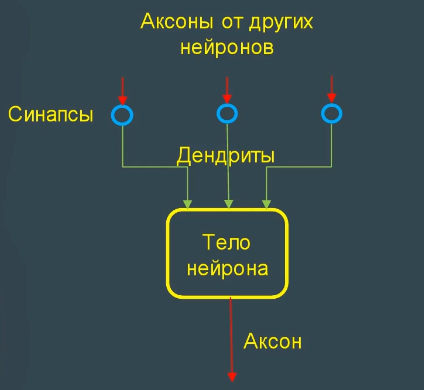

In [2]:
#Схема биологического нейрона
#От мощности синапса хависиь клдичесьво передаваемого сигнала
#С помощью настройки синапсов по сути тренируется нейронная сеть
from IPython.display import Image #display picture
Image('neuron1.png')

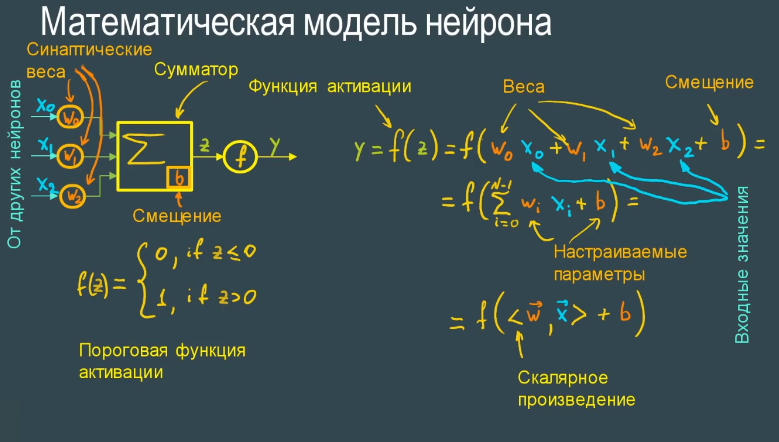

In [2]:
#Математическая модель нейрона
Image('neuron2.png')

# 1.2 Базовая работа в PyTorch

In [3]:
import torch

In [4]:
x = torch.zeros([3, 4])
x = torch.ones([3, 4, 5])

In [5]:
x.size(), x.shape

(torch.Size([3, 4, 5]), torch.Size([3, 4, 5]))

In [6]:
x[0, 0, 0], x[:, 0, 0] 

(tensor(1.), tensor([1., 1., 1.]))

In [7]:
x = torch.tensor([[x for x in range(1, 5)] for y in range(1, 5)])
y =  torch.tensor([[x for x in range(1, 5)] for y in range(1, 5)])

In [8]:
x + y, x * y, x % y #поэлементно

(tensor([[2, 4, 6, 8],
         [2, 4, 6, 8],
         [2, 4, 6, 8],
         [2, 4, 6, 8]]), tensor([[ 1,  4,  9, 16],
         [ 1,  4,  9, 16],
         [ 1,  4,  9, 16],
         [ 1,  4,  9, 16]]), tensor([[0, 0, 0, 0],
         [0, 0, 0, 0],
         [0, 0, 0, 0],
         [0, 0, 0, 0]]))

In [9]:
x > 3

tensor([[False, False, False,  True],
        [False, False, False,  True],
        [False, False, False,  True],
        [False, False, False,  True]])

In [10]:
import numpy as np
x = np.array([[x for x in range(1, 5)] for y in range(1, 5)])

In [11]:
y = torch.from_numpy(x)

In [12]:
x = torch.rand([2,3])

In [13]:
torch.cuda.is_available()

True

In [14]:
torch.device('cuda:0') #0 - video card index

device(type='cuda', index=0)

In [15]:
torch.device(type='cpu')

device(type='cpu')

In [16]:
device = torch.device('cuda:0' if torch.cuda.is_available else 'cpu')
device

device(type='cuda', index=0)

In [17]:
x_cuda = x.to(device)
x_cuda

tensor([[0.6340, 0.9683, 0.7609],
        [0.9957, 0.0399, 0.9620]], device='cuda:0')

In [18]:
%time y = (x - x + x * 10) **2

Wall time: 55 ms


In [19]:
%time y_cuda = (x_cuda - x_cuda + x_cuda * 10) **2

Wall time: 44 ms


In [20]:
x = torch.rand([2000 ,3000])

In [21]:
%time y = (x - x + x * 10) **2

Wall time: 648 ms


In [22]:
%time y_cuda = (x_cuda - x_cuda + x_cuda * 10) **2

Wall time: 1e+03 µs


# 1.3 Строим первую нейронную сеть

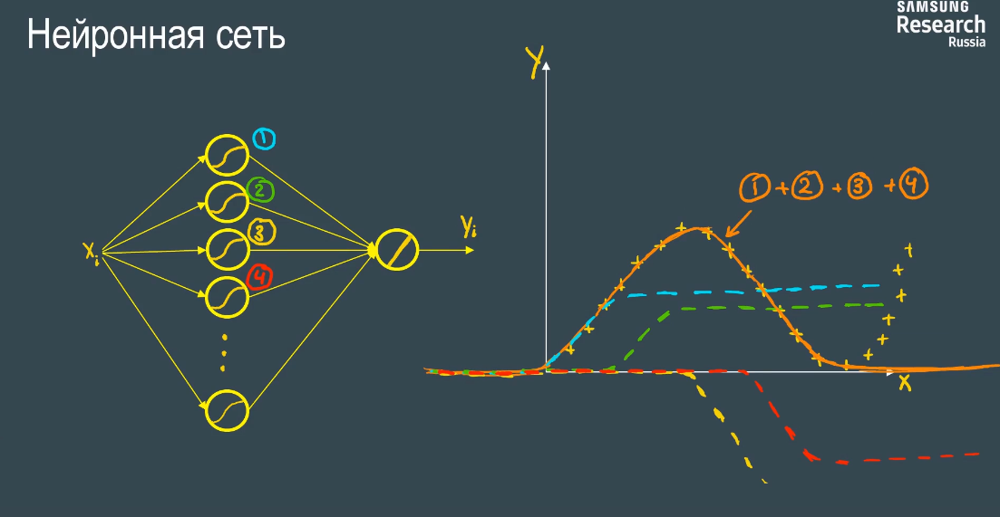

In [23]:
#Описание модели сигмоидами 
from IPython.display import Image #display picture
Image('neuron4.png')

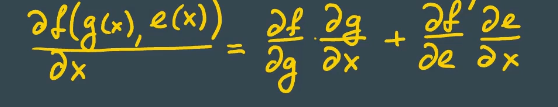

In [24]:
#правило производной сложной функции
from IPython.display import Image #display picture
Image('derivative.png')

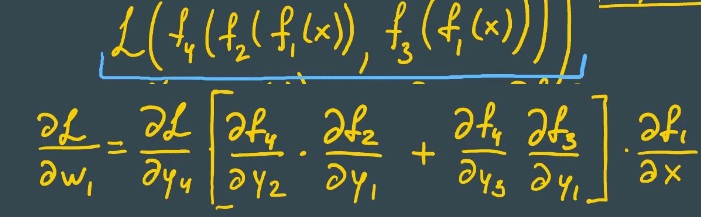

In [25]:
#правило производной сложной функции
#Обратное распространение ошибки - chain rule - правило цепочки
Image('derivative1.png')

In [26]:
#производные тангенса и сигмоиды 
#sigma'(x) = sigma(x)*(1-sigma(x))
#tanh'(x) = 1- (tanh(x))^2

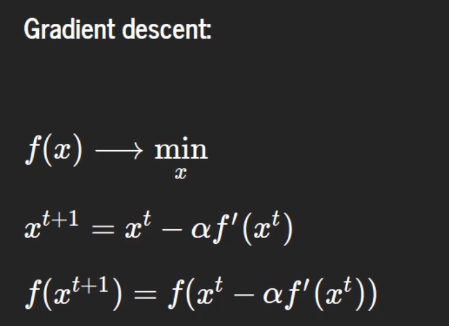

In [27]:
from IPython.display import Image #display picture
Image('gradient_descent.png')

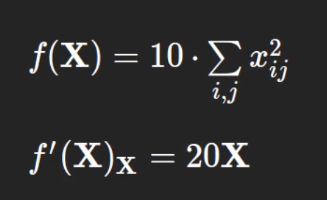

In [28]:
#производная по тензору
Image('derivative2.png')

In [29]:
import torch
w = torch.tensor( [[1.,2.],[4.,5.]], requires_grad=True)
function = 10 * torch.log( ( w + 1. ) ).sum()
function.backward()
print(w-w.grad)

tensor([[-4.0000, -1.3333],
        [ 2.0000,  3.3333]], grad_fn=<SubBackward0>)


# 1.4 Реализация градиентного спуска

#### Gradient descent:
<br>

$f(x) \longrightarrow  \displaystyle \min_{x} $

$x^{t+1} = x^t-\alpha{f'(x^t)}$

$f(x^{t+1}) = f(x^t-\alpha{f'(x^t)})$

$f(\textbf{X}) = 10\cdot\sum\limits_{i, j}x_{ij}^2$

$f'(\textbf{X})_{\textbf{X}} = ? $

$f'(\textbf{X})_{x_{kl}} = \Big( 10\cdot\sum\limits_{i, j}x_{ij}^2\Big)_{x_{kl}}' = 10 \cdot\Big(\sum\limits_{i, j}x_{ij}^2\Big)_{x_{kl}}' $

$ \quad = 10 \cdot\sum\limits_{i, j}\Big(x_{ij}^2\Big)_{x_{kl}}' $

$ \quad = 10 \cdot\sum\limits_{i, j}2 x_{ij} \big(x_{ij}\big)_{x_{kl}}' $


$ \quad = 10 \cdot 2 x_{kl} \cdot 1 = 20 x_{kl} $

$f(\textbf{X}) = 10\cdot\sum\limits_{i, j}x_{ij}^2$

$f'(\textbf{X})_{\textbf{X}} = 20 \textbf{X} $

In [30]:
import torch

######перекладываем расчет на gpu
device = torch.device('cuda:0' 
                      if torch.cuda.is_available() 
                      else 'cpu')
x = x.to(device)


x = torch.tensor(
    [[1.,  2.,  3.,  4.],
     [5.,  6.,  7.,  8.],
     [9., 10., 11., 12.]], requires_grad=True)

function = 10 * (x ** 2).sum()
#расчет производной
x.retain_grad()
function.backward()

print(x.grad, '<- gradient')

tensor([[ 20.,  40.,  60.,  80.],
        [100., 120., 140., 160.],
        [180., 200., 220., 240.]]) <- gradient


In [31]:
#Задание по расчету градиента для функции (w + 7).log().log().prod()
w = torch.tensor(
    [[5.,  10.],
     [1.,  2.]], requires_grad=True)
function = torch.prod(torch.log(torch.log(w + 7)))
function.backward()
print(w.grad, '<- gradient')

import torch

w = torch.tensor([[5., 10.], [1., 2.]], requires_grad=True)
alpha = 0.001

for _ in range(500):
    # it's critical to calculate function inside the loop:
    function = (w + 7).log().log().prod()
    function.backward()
    w.data -=  0.001 * w.grad #меняет тензор
    w.grad.zero_() #обнуляет градиент

print(w)

alpha = 0.001
optimizer =  torch.optim.SGD([w], lr=0.001)

for _ in range(500):
    # it's critical to calculate function inside the loop:
    function = (w + 7).log().log().prod()
    function.backward()
    optimizer.step()
    optimizer.zero_grad()

print(w)

tensor([[0.0201, 0.0109],
        [0.0449, 0.0351]]) <- gradient
tensor([[4.9900, 9.9948],
        [0.9775, 1.9825]], requires_grad=True)
tensor([[4.9800, 9.9895],
        [0.9550, 1.9649]], requires_grad=True)


In [32]:
print(function.grad_fn)
print(function.grad_fn.next_functions[0][0])
print(function.grad_fn.next_functions[0][0].next_functions[0][0])
print(function.grad_fn.next_functions[0][0].next_functions[0][0].next_functions[0][0])

In [33]:
x = torch.tensor(
    [[1.,  2.,  3.,  4.],
     [5.,  6.,  7.,  8.],
     [9., 10., 11., 12.]], requires_grad=True)

In [34]:
function = 10 * (x ** 2).sum()
function.backward()

In [35]:
x, function

(tensor([[ 1.,  2.,  3.,  4.],
         [ 5.,  6.,  7.,  8.],
         [ 9., 10., 11., 12.]], requires_grad=True),
 tensor(6500., grad_fn=<MulBackward0>))

In [36]:
x.grad

tensor([[ 20.,  40.,  60.,  80.],
        [100., 120., 140., 160.],
        [180., 200., 220., 240.]])

In [37]:
x.data -= 0.001 * x.grad #меняет тензор

In [38]:
x.grad.zero_() #обнуляет градиент

tensor([[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]])

In [39]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def show_contours(objective,
                  x_lims=[-10.0, 10.0], 
                  y_lims=[-10.0, 10.0],
                  x_ticks=100,
                  y_ticks=100):
    x_step = (x_lims[1] - x_lims[0]) / x_ticks
    y_step = (y_lims[1] - y_lims[0]) / y_ticks
    X, Y = np.mgrid[x_lims[0]:x_lims[1]:x_step, y_lims[0]:y_lims[1]:y_step]
    res = []
    for x_index in range(X.shape[0]):
        res.append([])
        for y_index in range(X.shape[1]):
            x_val = X[x_index, y_index]
            y_val = Y[x_index, y_index]
            res[-1].append(objective(np.array([[x_val, y_val]]).T))
    res = np.array(res)
    plt.figure(figsize=(7,7))
    plt.contour(X, Y, res, 100)
    plt.xlabel('$x_1$')
    plt.ylabel('$x_2$')

In [40]:
import torch

x = torch.tensor(
    [8., 8.], requires_grad=True)
var_history = []
fn_history = []

def function_parabola(variable):
    return 10 * (variable ** 2).sum()

def make_gradient_step(function, variable):
    function_result = function(variable)
    function_result.backward()
    variable.data -= 0.001 * variable.grad
    variable.grad.zero_()

for i in range(500):
    var_history.append(x.data.cpu().numpy().copy())
    fn_history.append(function_parabola(x).data.cpu().numpy().copy())
    make_gradient_step(function_parabola, x)

In [41]:
import torch

x = torch.tensor(
    [8., 8.], requires_grad=True)
var_history = []
fn_history = []

optimizer = torch.optim.SGD([x], lr=0.001) #оптимизатор - стохастических градиентный спуск из пакета torch.optim

def function_parabola(variable):
    return 10 * (variable ** 2).sum()

def make_gradient_step(function, variable):
    function_result = function(variable)
    function_result.backward()
    optimizer.step()
    optimizer.zero_grad()
    
for i in range(500):
    var_history.append(x.data.numpy().copy())
    fn_history.append(function_parabola(x).data.cpu().numpy().copy())
    make_gradient_step(function_parabola, x)

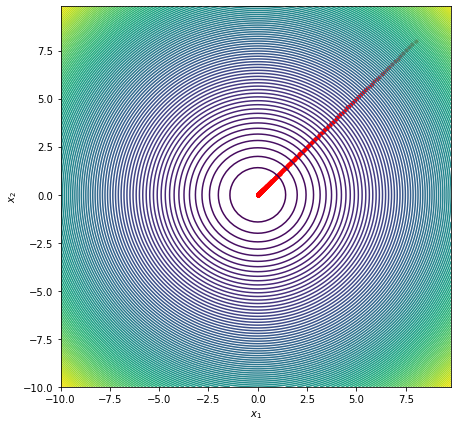

In [42]:
show_contours(function_parabola)
plt.scatter(np.array(var_history)[:,0], np.array(var_history)[:,1], s=10, c='r');

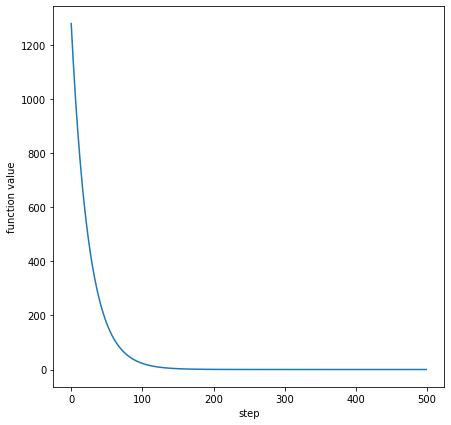

In [43]:
plt.figure(figsize=(7,7))
plt.plot(fn_history);
plt.xlabel('step')
plt.ylabel('function value'); #функция потерь (экспонента)

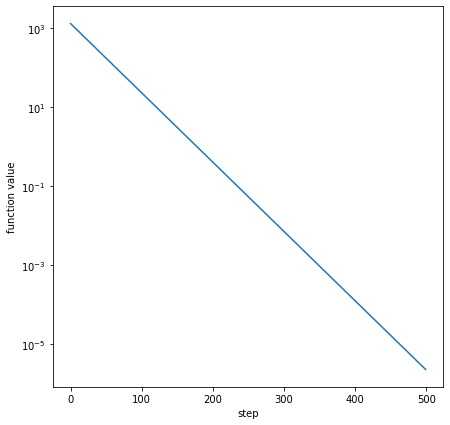

In [44]:
plt.figure(figsize=(7,7))
plt.semilogy(fn_history);
plt.xlabel('step')
plt.ylabel('function value'); #логорифмированная функция

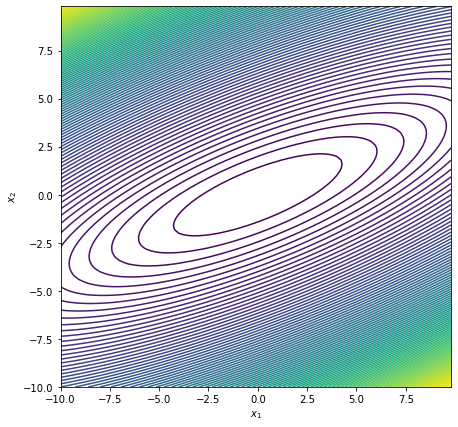

In [45]:
def function_skewed(variable):
    gramma = torch.tensor([[1., -1.], [1., 1.]]) @ torch.tensor([[1.0, 0.0], [0.0, 4.0]])
    res = 10 * (variable.unsqueeze(0) @ (gramma @ variable.unsqueeze(1))).sum()
    return res

def function_skewed_np(variable):
    gramma = np.array([[1, -1], [1, 1]]) @ np.array([[1.0, 0.0], [0.0, 4.0]])
    res = 10 * (variable.transpose(1, 0) @ (gramma @ variable)).sum()
    return res

show_contours(function_skewed_np)

In [46]:
x = torch.tensor(
    [8., 8.], requires_grad=True)
var_history = []
fn_history = []

optimizer = torch.optim.SGD([x], lr=0.001)

for i in range(500):
    var_history.append(x.data.cpu().numpy().copy())
    fn_history.append(function_skewed(x).data.cpu().numpy().copy())
    make_gradient_step(function_skewed, x)

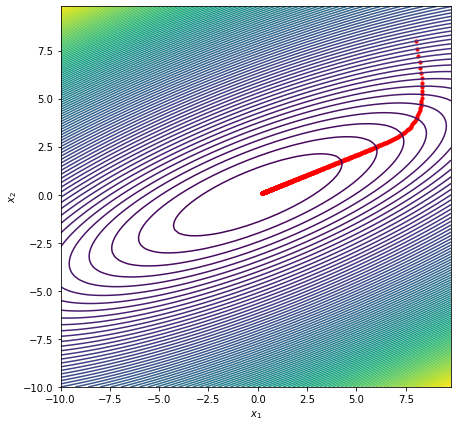

In [47]:
show_contours(function_skewed_np)
plt.scatter(np.array(var_history)[:,0], np.array(var_history)[:,1], s=10, c='r');

# 1.5 Задачи, решаемые при помощи нейронных сетей

In [48]:
#Функции потерь и задачи, которые им соответствуют:
#1)Задача регрессии -MSE - средний квадрат ошибок (y-y')^2 производная среднеквадратичной функции потерь может 
#зануляться если использовать в качестве функции активации - сигмоиду 
#2)Задача классификации  бинарной классификации BCE(p, t) = -t*log(p) - (1-t)*log(1-p), где p - sigma(y) - бинарная 
#кросс-энтропия
#3)Задача классификации CE(p, t) = -sum(tc*log(pc)) - кросс энтропия для нескольких классов
#где t - таргетное значение для класса(0 для всех кроме одного), p - вероятность этого класса(soft-max от всех классов)
#4)Локализация, детекция, сегментация и super-resolution - нахождение объекта на картинке
#5)Сегментация - определение принадлежит пиксель на картинке объекту или нет
#6)Сжатие размерности 
#7)Задача superresolution - увеличение разрешения входной картинки

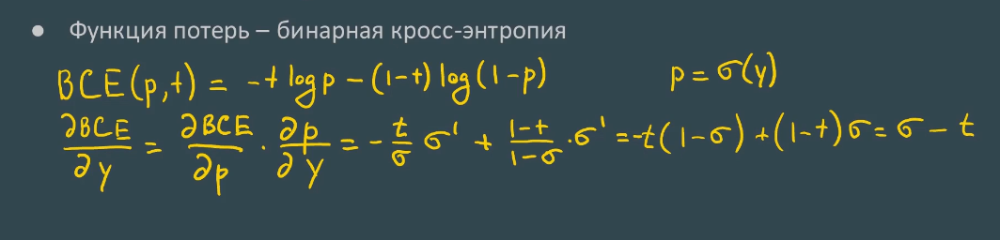

In [49]:
#Производная бинарной кросс-энтропии по y
from IPython.display import Image #display picture
Image('derivative4.png')

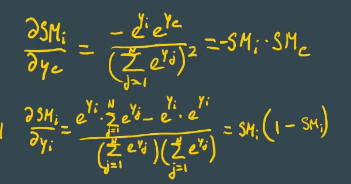

In [50]:
#производная функции softmax 
#SMi(y) = e^yi/sum(e^yj) - Soft-max - функция активации для классификации нескольких классов 
#возвращает вероятность для каждого класса
Image('derivative6.png')

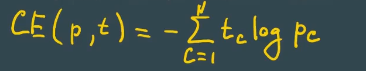

In [51]:
#Кросс-энтропия для soft-max
Image('cross-entropy.png')

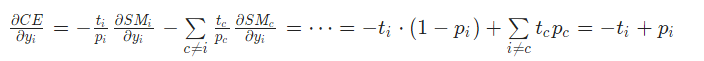

In [52]:
#производная кросс энтропии по выходу
Image('cross-entropy1.png')

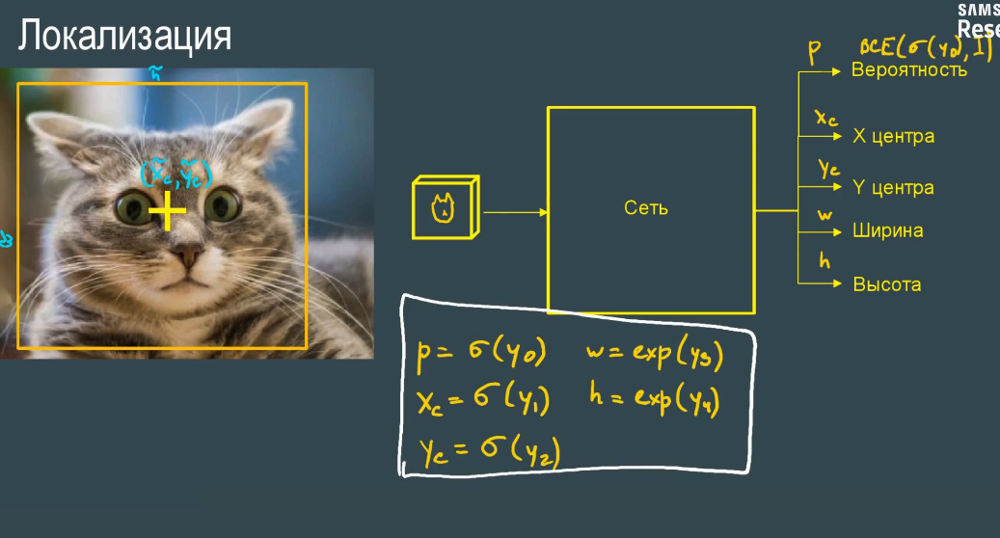

In [53]:
#Задача локализации и функции активации для неё
#Функция потерь для сигмоид - BCE(binar cross entropy)
#Функции потерь для экспонент - MSE(mid square error)
Image('localization.png')

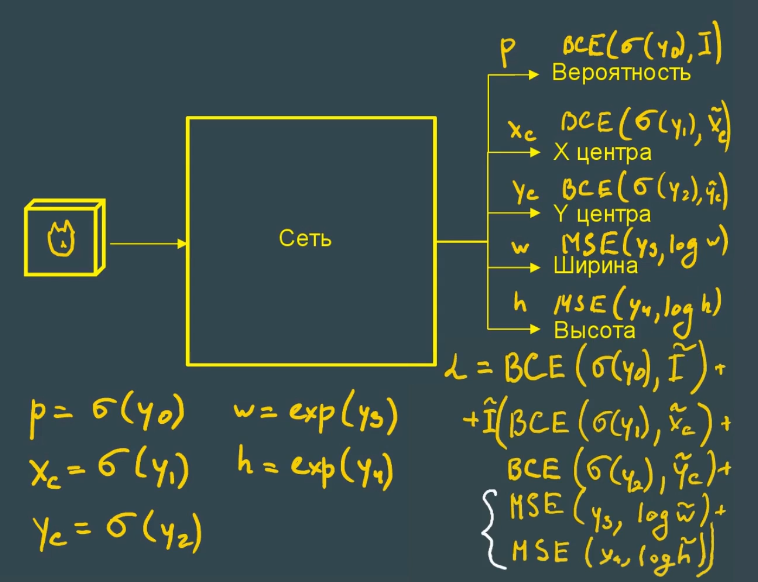

In [54]:
#a - функция потерь
Image('localization1.png')

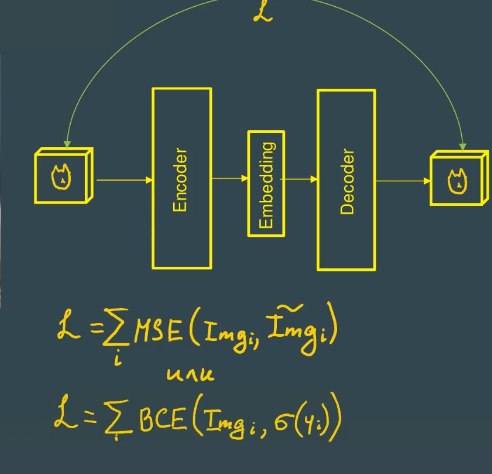

In [55]:
#понижение размерности
Image('dim-reduction.png')

# 1.6 Строим нейронную сеть для задачи регрессии

In [56]:
import torch
import matplotlib.pyplot as plt

In [57]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (13.0, 5.0)

# a)Train dataset

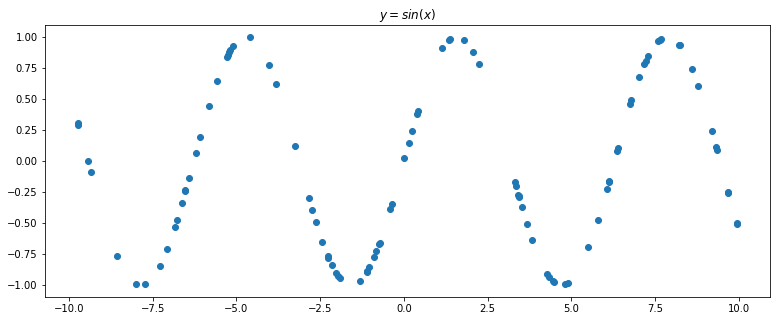

In [58]:
x_train = torch.rand(100)
x_train = x_train * 20.0 - 10.0

y_train = torch.sin(x_train)

plt.plot(x_train.numpy(), y_train.numpy(), 'o')
plt.title('$y = sin(x)$');

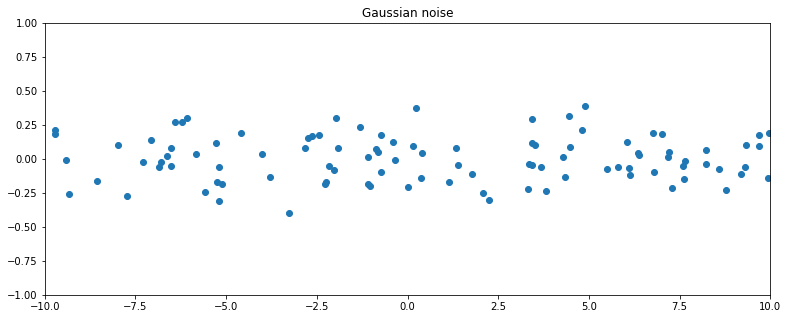

In [59]:
noise = torch.randn(y_train.shape) / 5.

plt.plot(x_train.numpy(), noise.numpy(), 'o')
plt.axis([-10, 10, -1, 1])
plt.title('Gaussian noise');

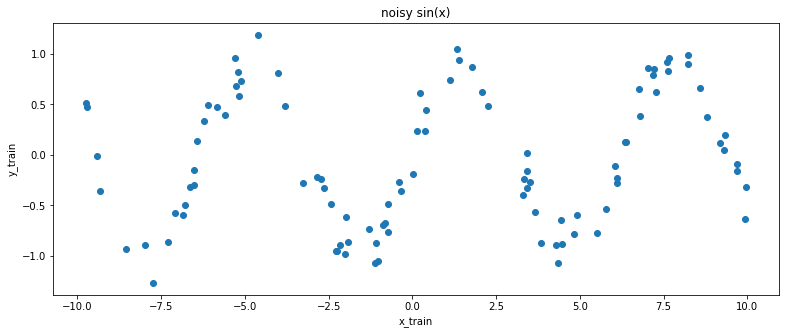

In [60]:
y_train = y_train + noise
plt.plot(x_train.numpy(), y_train.numpy(), 'o')
plt.title('noisy sin(x)')
plt.xlabel('x_train')
plt.ylabel('y_train');

In [61]:
x_train.unsqueeze_(1)
y_train.unsqueeze_(1);

In [62]:
tmp = torch.Tensor([1,2,3])
print(tmp)
print(tmp.unsqueeze(1))

tensor([1., 2., 3.])
tensor([[1.],
        [2.],
        [3.]])


# b)Validation dataset

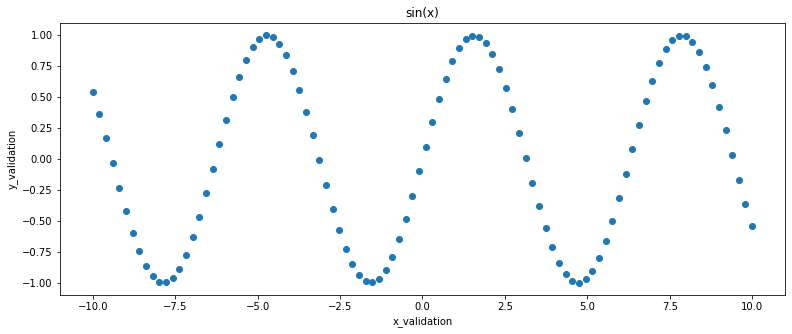

In [63]:
x_validation = torch.linspace(-10, 10, 100)
y_validation = torch.sin(x_validation.data)
plt.plot(x_validation.numpy(), y_validation.numpy(), 'o')
plt.title('sin(x)')
plt.xlabel('x_validation')
plt.ylabel('y_validation');

In [64]:
x_validation.unsqueeze_(1)
y_validation.unsqueeze_(1);

# c)Model construction

In [65]:
class SineNet(torch.nn.Module):
    def __init__(self, n_hidden_neurons):
        super(SineNet, self).__init__()
        self.fc1 = torch.nn.Linear(1, n_hidden_neurons)        #вход
        self.act1 = torch.nn.Sigmoid()                         #скрытый слой
        self.fc2 = torch.nn.Linear(n_hidden_neurons, 1)        #выход

    def forward(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.fc2(x)
        return x

sine_net = SineNet(50) #принимает количество нейронов

# d)Prediction

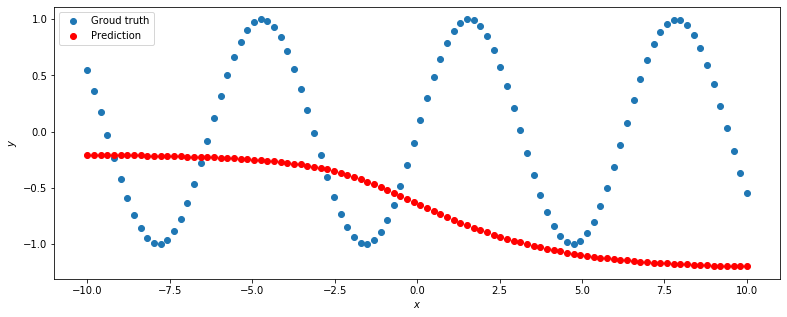

In [66]:
def predict(net, x, y):
    y_pred = net.forward(x)

    plt.plot(x.numpy(), y.numpy(), 'o', label='Groud truth')
    plt.plot(x.numpy(), y_pred.data.numpy(), 'o', c='r', label='Prediction');
    plt.legend(loc='upper left')
    plt.xlabel('$x$')
    plt.ylabel('$y$')

predict(sine_net, x_validation, y_validation)

# e)Optimizer

In [67]:
optimizer = torch.optim.Adam(sine_net.parameters(), lr=0.01) #передаются параметры для обучения

# f)Loss function

In [68]:
def loss(pred, target):
    squares = (pred - target) ** 2
    return squares.mean()

# g)Training procedure

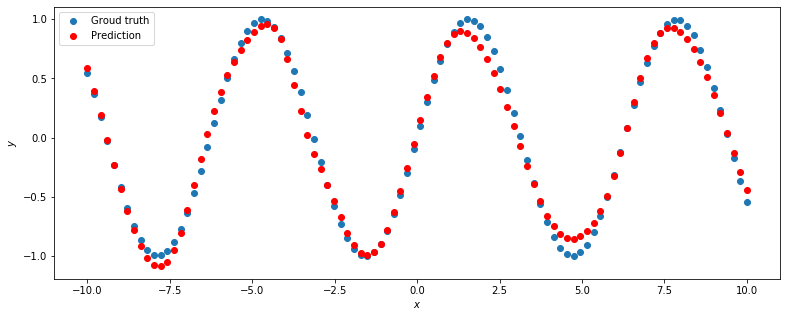

In [69]:
for epoch_index in range(2000):
    optimizer.zero_grad()

    y_pred = sine_net.forward(x_train)
    loss_val = loss(y_pred, y_train)

    loss_val.backward()

    optimizer.step()

predict(sine_net, x_validation, y_validation)

# h)Examples

In [70]:
import torch

class RegressionNet(torch.nn.Module):
    def __init__(self, n_hidden_neurons):
        super(RegressionNet, self).__init__()
        self.fc1 = torch.nn.Linear(1, n_hidden_neurons)        #вход
        self.act1 = torch.nn.Sigmoid()                         #скрытый слой
        self.fc2 = torch.nn.Linear(n_hidden_neurons, 1)        #выход
    def forward(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.fc2(x)
        return x

net = RegressionNet(100)

def target_function(x):
    return 2**x * torch.sin(2**-x)

# ------Dataset preparation start--------:
x_train =  torch.linspace(-10, 5, 100)
y_train = target_function(x_train)
noise = torch.randn(y_train.shape) / 20.
y_train = y_train + noise
x_train.unsqueeze_(1)
y_train.unsqueeze_(1)

x_validation = torch.linspace(-10, 5, 100)
y_validation = target_function(x_validation)
x_validation.unsqueeze_(1)
y_validation.unsqueeze_(1)
# ------Dataset preparation end--------:

def metric(pred, target):
    return (pred - target).abs().mean()

optimizer = torch.optim.Adam(net.parameters(), lr=0.001)

def loss(pred, target):
    abs_ = abs(pred - target)
    return abs_.mean()

for epoch_index in range(3000):
    optimizer.zero_grad()

    y_pred = net.forward(x_train)
    loss_value = loss(y_pred, y_train)
    
    loss_value.backward()
    optimizer.step()

print(metric(net.forward(x_validation), y_validation).item())

0.029016658663749695


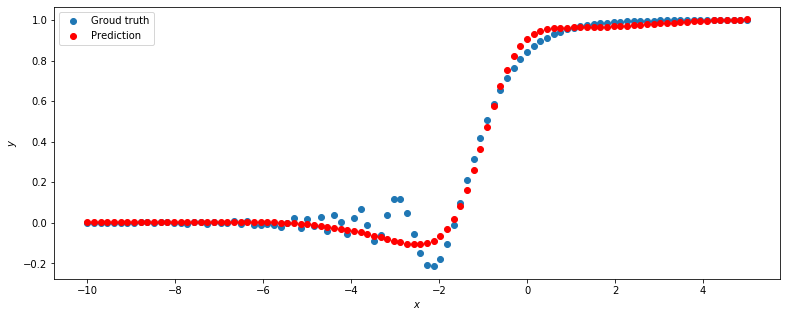

In [71]:
def predict(net, x, y):
    y_pred = net.forward(x)

    plt.plot(x.numpy(), y.numpy(), 'o', label='Groud truth')
    plt.plot(x.numpy(), y_pred.data.numpy(), 'o', c='r', label='Prediction');
    plt.legend(loc='upper left')
    plt.xlabel('$x$')
    plt.ylabel('$y$')


predict(net, x_validation, y_validation)

In [72]:
# 3.5.15
import torch

class RegressionNet(torch.nn.Module):
  def __init__(self, n_hidden_neurons):
    super(RegressionNet, self).__init__()
    self.fc1 = torch.nn.Linear(1, n_hidden_neurons)
    self.act1 = torch.nn.ReLU()
    self.fc2 = torch.nn.Linear(n_hidden_neurons, n_hidden_neurons)
    self.act2 = torch.nn.ReLU()
    self.fc3 = torch.nn.Linear(n_hidden_neurons, 1)
    
  def forward(self, x):
    x = self.fc1(x)
    x = self.act1(x)
    x = self.fc2(x)
    x = self.act2(x)
    x = self.fc3(x)
    return x

net = RegressionNet(5)

def target_function(x):
    return 2**x * torch.sin(2**-x)

# ------Dataset preparation start--------:
x_train =  torch.linspace(-10, 5, 100)
y_train = target_function(x_train)
noise = torch.randn(y_train.shape) / 20.
y_train = y_train + noise
x_train.unsqueeze_(1)
y_train.unsqueeze_(1)

x_validation = torch.linspace(-10, 5, 100)
y_validation = target_function(x_validation)
x_validation.unsqueeze_(1)
y_validation.unsqueeze_(1)
# ------Dataset preparation end--------:

def metric(pred, target):
    return (pred - target).abs().mean()

optimizer = torch.optim.Adam(net.parameters(), lr=0.01)

def loss(pred, target):
    return metric(pred, target)

for epoch_index in range(2000):
    optimizer.zero_grad()

    y_pred = net.forward(x_train)
    loss_value = loss(y_pred, y_train)
    loss_value.backward()
    optimizer.step()

print(metric(net.forward(x_validation), y_validation).item())

0.02697695977985859


In [73]:
import torch

class MyNet(torch.nn.Module):
    def __init__(self, sizes=[1,1], funs=[torch.nn.Sigmoid()]):
        """
        Создание нейроной сети\n

        sizes - размеры слоев,
            если указан int, то будет один скрытый слой с sizes нейронами(вход. и выход. слой с 1 нейроном),
            если tuple или list - будет создана сеть с len(sizes)-2 скрытыми слоями,
            в каждом слое по sizes[i] нейронов\n
        funs - функции активации применяемые для каждого слоя,
            если указана одна функция, она будет примененна ко всем слоям, кроме входного,
            если указан tuple или list, то функции будут применять по очереди начиная с первого скрытого слоя.
            Если функция в слое не нужна, то надо указать 0 или None\n
        """
        super().__init__()
        # проверяем тип и размености funs и sizes
        if isinstance(sizes,(tuple,list)) and isinstance(funs,(tuple,list)):
            assert len(sizes)-1 == len(funs), 'len(funs) должно быть = len(sizes)-1'
        sizes = [1,int(sizes),1] if isinstance(sizes,int) else sizes 
        funs = [funs]*(len(sizes)-1) if not isinstance(funs,(tuple,list)) else funs
        # кол-во нейронов входного слоя
        left = sizes[0]
        # здесь будут храниться наши слои
        layers = []
        # поэлементно добавляем слои и функции активации
        for right,f in zip(sizes[1:],funs):
            layers.append(torch.nn.Linear(left,right))
            if f: # если втретим 0 или None, то ничего не добавим
                layers.append(f)
            left = right
        self.layers = torch.nn.Sequential(*layers)
    def forward(self, x):
        return self.layers(x)

f_tanh = torch.nn.Tanh()
f_sigma = torch.nn.Sigmoid()
f_relu = torch.nn.ReLU()

net = MyNet([1,20,20,1],[f_tanh,f_tanh,0])

def target_function(x):
    return 2**x * torch.sin(2**-x)

# ------Dataset preparation start--------:
x_train =  torch.linspace(-10, 5, 100)
y_train = target_function(x_train)
noise = torch.randn(y_train.shape) / 20.
y_train = y_train + noise
x_train.unsqueeze_(1)
y_train.unsqueeze_(1)

x_validation = torch.linspace(-10, 5, 100)
y_validation = target_function(x_validation)
x_validation.unsqueeze_(1)
y_validation.unsqueeze_(1)
# ------Dataset preparation end--------:

def metric(pred, target):
    return (pred - target).abs().mean()

optimizer = torch.optim.Adam(net.parameters(), lr=0.05)

def loss(pred, target):
    return ((pred-target)**2).mean()

for epoch_index in range(100):
    optimizer.zero_grad()

    y_pred = net.forward(x_train)# make forward
    loss_value = loss(y_pred, y_train)
    loss_value.backward()# make backward
    optimizer.step()# make step

print(metric(net.forward(x_validation), y_validation).item())

0.025024259462952614


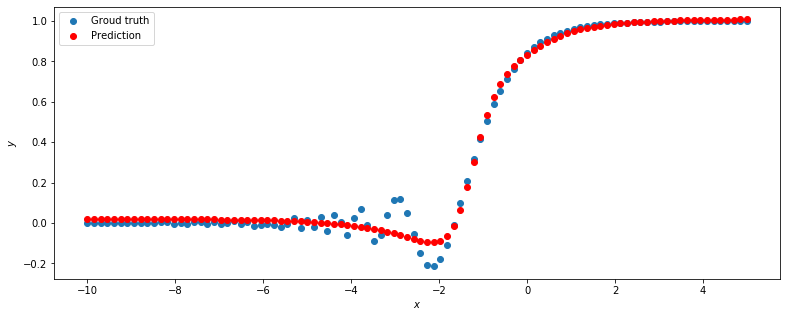

In [74]:
def predict(net, x, y):
    y_pred = net.forward(x)

    plt.plot(x.numpy(), y.numpy(), 'o', label='Groud truth')
    plt.plot(x.numpy(), y_pred.data.numpy(), 'o', c='r', label='Prediction');
    plt.legend(loc='upper left')
    plt.xlabel('$x$')
    plt.ylabel('$y$')


predict(net, x_validation, y_validation)

# 1.7 Строим нейронную сеть для задачи классификации

In [75]:
import torch
import random
import numpy as np

random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.deterministic = True

In [76]:
import sklearn.datasets
wine = sklearn.datasets.load_wine()
wine.data.shape

(178, 13)

In [77]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    wine.data[:, :2], 
    wine.target, 
    test_size=0.3, 
    shuffle=True)

X_train = torch.FloatTensor(X_train)
X_test = torch.FloatTensor(X_test)
y_train = torch.LongTensor(y_train)
y_test = torch.LongTensor(y_test)

In [78]:
class WineNet(torch.nn.Module):
    def __init__(self, n_hidden_neurons): #количество скрытых нейронов
        super(WineNet, self).__init__()
        
        self.fc1 = torch.nn.Linear(2, n_hidden_neurons)
        self.activ1 = torch.nn.Sigmoid()
        self.fc2 = torch.nn.Linear(n_hidden_neurons, 
                                   n_hidden_neurons)
        self.activ2 = torch.nn.Sigmoid()
        self.fc3 = torch.nn.Linear(n_hidden_neurons, 3)
        self.sm = torch.nn.Softmax(dim=1)
        
    def forward(self, x):
        x = self.fc1(x)
        x = self.activ1(x)
        x = self.fc2(x)
        x = self.activ2(x)
        x = self.fc3(x)
        return x

    def inference(self, x):         
        x = self.forward(x)
        x = self.sm(x)       #применение softmax
        return x
    
wine_net = WineNet(5)

In [79]:
loss = torch.nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(wine_net.parameters(),  #wine_net.parameters() - это веса
                             lr=1.0e-3)             #lr = 0.001 считается оптимальным

In [80]:
np.random.permutation(5) #перемешивает числа от 0 до 4 

array([2, 0, 1, 4, 3])

In [81]:
batch_size = 10             #кусок данных, по которому считаются веса и прочие параметры
                            #каждую эпоху нейросеть видит весь обучающий датасет перемешанный и разделенный на батчи
for epoch in range(5000):
    order = np.random.permutation(len(X_train))             #перемешиваем дата сет
    for start_index in range(0, len(X_train), batch_size):
        optimizer.zero_grad()
        
        batch_indexes = order[start_index:start_index+batch_size]
        
        x_batch = X_train[batch_indexes]
        y_batch = y_train[batch_indexes]
        
        preds = wine_net.forward(x_batch) 
        
        loss_value = loss(preds, y_batch)
        loss_value.backward()                 #считаем производную, которая окажется в оптимайзере
         
        optimizer.step()                      #оптимайзер делает шаг градиентного спуска
        
    if epoch % 100 == 0:                         #считаем метрики точности каждые 100 эпох
        test_preds = wine_net.forward(X_test)
        test_preds = test_preds.argmax(dim=1)
        print((test_preds == y_test).float().mean())

tensor(0.4074)
tensor(0.4074)
tensor(0.4630)
tensor(0.5000)
tensor(0.4259)
tensor(0.4074)
tensor(0.5185)
tensor(0.5185)
tensor(0.4444)
tensor(0.4259)
tensor(0.5000)
tensor(0.5370)
tensor(0.5370)
tensor(0.5370)
tensor(0.7407)
tensor(0.6852)
tensor(0.6481)
tensor(0.6852)
tensor(0.6667)
tensor(0.6852)
tensor(0.6852)
tensor(0.6852)
tensor(0.7222)
tensor(0.7037)
tensor(0.7407)
tensor(0.7593)
tensor(0.7778)
tensor(0.7963)
tensor(0.8148)
tensor(0.8148)
tensor(0.8148)
tensor(0.8148)
tensor(0.8333)
tensor(0.8148)
tensor(0.8333)
tensor(0.8333)
tensor(0.8333)
tensor(0.8333)
tensor(0.8519)
tensor(0.8519)
tensor(0.8519)
tensor(0.8519)
tensor(0.8519)
tensor(0.8519)
tensor(0.8519)
tensor(0.8519)
tensor(0.8519)
tensor(0.8519)
tensor(0.8519)
tensor(0.8519)


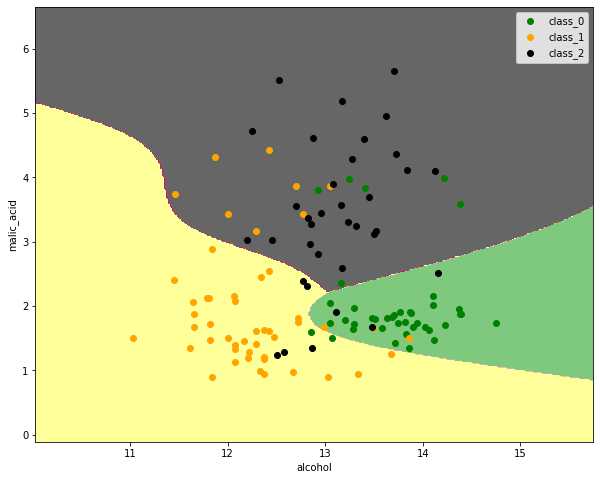

In [82]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['figure.figsize'] = (10, 8)

n_classes = 3
plot_colors = ['g', 'orange', 'black']
plot_step = 0.02

x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1

xx, yy =  torch.meshgrid(torch.arange(x_min, x_max, plot_step),
                         torch.arange(y_min, y_max, plot_step))

preds = wine_net.inference(
    torch.cat([xx.reshape(-1, 1), yy.reshape(-1, 1)], dim=1))

preds_class = preds.data.numpy().argmax(axis=1)
preds_class = preds_class.reshape(xx.shape)
plt.contourf(xx, yy, preds_class, cmap='Accent')

for i, color in zip(range(n_classes), plot_colors):
    indexes = np.where(y_train == i)
    plt.scatter(X_train[indexes, 0], 
                X_train[indexes, 1], 
                c=color, 
                label=wine.target_names[i],
                cmap='Accent')
    plt.xlabel(wine.feature_names[0])
    plt.ylabel(wine.feature_names[1])
    plt.legend()

# 1.8 Задание 

In [83]:
import torch
import random
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_wine

In [84]:
wine = load_wine()
features =  13 # use 13 features

X_train, X_test, y_train, y_test = train_test_split(
    wine.data[:, :features], 
    wine.target, 
    test_size=0.3, 
    shuffle=True)

X_train = torch.FloatTensor(X_train)
X_test = torch.FloatTensor(X_test)
y_train = torch.LongTensor(y_train)
y_test = torch.LongTensor(y_test)

In [85]:
class WineNet(torch.nn.Module):
    def __init__(self,n_input, n_hidden_neurons):
        super(WineNet, self).__init__()
        self.fc1 = torch.nn.Linear(n_input, n_hidden_neurons)
        self.activ1 = torch.nn.Sigmoid()
        self.fc2 = torch.nn.Linear(n_hidden_neurons, 
                                   n_hidden_neurons)
        self.activ2 = torch.nn.Sigmoid()
        self.fc3 = torch.nn.Linear(n_hidden_neurons, 3)
        self.sm = torch.nn.Softmax(dim=1)
        
    def forward(self, x):
        x = self.fc1(x)
        x = self.activ1(x)
        x = self.fc2(x)
        x = self.activ2(x)
        x = self.fc3(x)
        return x

    def inference(self, x):
        x = self.forward(x)
        x = self.sm(x)
        return x
    
n_input =  13
n_hidden =  50
wine_net = WineNet(n_input, n_hidden)

In [86]:
loss = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(wine_net.parameters(), lr=1.0e-3)

In [87]:
batch_size =  10

for epoch in range(2000):
    order = np.random.permutation(len(X_train))
    for start_index in range(0, len(X_train), batch_size):
        optimizer.zero_grad()
        
        batch_indexes = order[start_index:start_index+batch_size]
        
        x_batch = X_train[batch_indexes]
        y_batch = y_train[batch_indexes]
        
        preds = wine_net.forward(x_batch) 
        
        loss_value = loss(preds, y_batch)
        loss_value.backward()
        
        optimizer.step()
        
    if epoch % 10 == 0:
        test_preds = wine_net.forward(X_test)
        test_preds = test_preds.argmax(dim=1)

In [88]:
print(wine_net.fc1.in_features, np.asarray((test_preds == y_test).float().mean()) > 0.8)
# need to get 13 True

13 True


# 1.9 Методы оптимизации

In [5]:
#Методы оптимизации нейронных сетей:
#1)SGD (стохастический градиентный спуск)
#2)SGD с импульсом - это СГД, где b - коэффициент импульса, a - скорость обучения
#3)SGD с импульсом, с заглядыванием вперед
#4)SGD с экспоненциальным скользящим средним(MSE)
#5)RPROP метод оптимизации учитывающий только знак градиента (sign - знак)
#6)RMSProp
#7)Adam

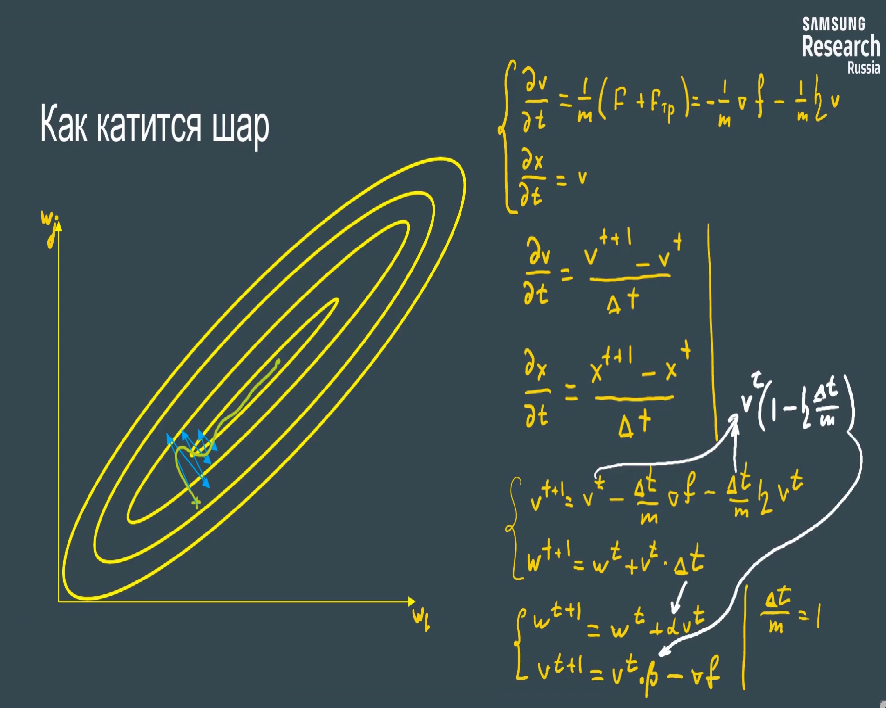

In [90]:
#Стохастический градиентный спуск с импульсом - это СГД, где b - коэффициент импульса, a - скорость обучения
Image('impulse-SGD.png')

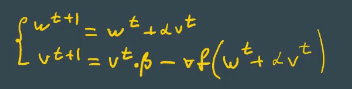

In [91]:
#Стохастический градиентный спуск с импульсом, с заглядыванием вперед
Image('SGD2.png')

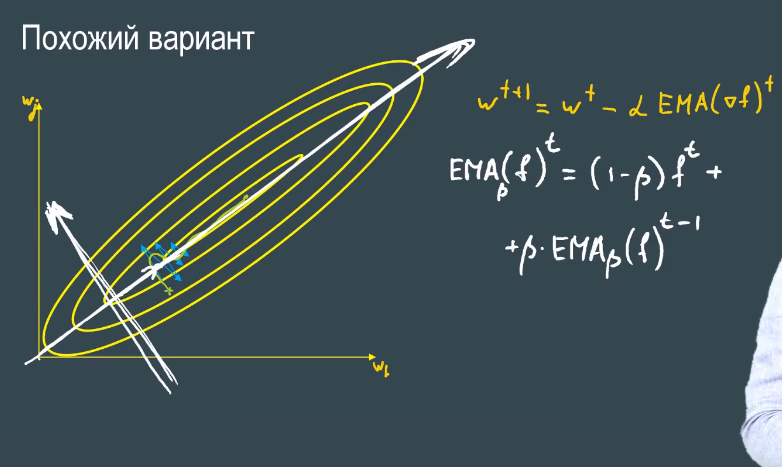

In [92]:
#СГД с экспоненциальным скользящим средним
Image('SGD-EMA.png')

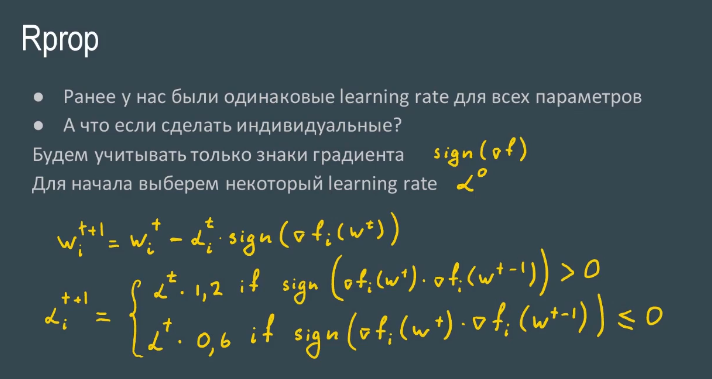

In [2]:
#RPROP метод оптимизации учитывающий только знак градиента (sign - знак)
#при этом скорость обучения можно увеличить, если знак градиента сохраняется
#или снизить если знак градиента изменяется или зануляется
#Недостаток RPROP - плохая работа с батчами
from IPython.display import Image #display picture
Image('RPROP.png')

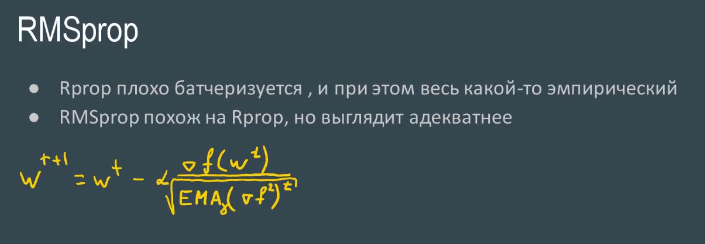

In [3]:
#RMSProp
#если вдоль какого-то параметра функция слишком большая, то происходит уменьшение скорости движения вдоль него
#если вдоль какого-то параметра функция слишком маленькая, то происходит увеличение скорости движения вдоль него
Image('RMSprop.png')

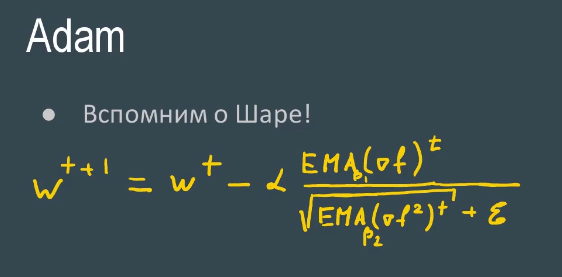

In [4]:
#Оптимальные параметры для Adam уже изевстны: a = 3*10^-4, b1 = 0.9, b2 = 0.999
Image('Adam.png')

In [1]:
import pandas as pd
def EMA(values_list, alpha):
    if len(values_list) == 0:
        return 0
    else:
        last = values_list[0]
        return alpha * EMA(values_list[1:], alpha) + (1-alpha) * last

calc = {0.1:[], 0.5:[], 0.9:[]}
for n in range(1, 10):
    values_list = [100] * n
    for alpha in calc.keys():
        e = EMA(values_list, alpha)
        m = sum(values_list) / len(values_list)
        calc[alpha].append(e/m)
    
pd.DataFrame(calc)

,0.1,0.5,0.9
0,0.900000,0.500000,0.100000
1,0.990000,0.750000,0.190000
2,0.999000,0.875000,0.271000
3,0.999900,0.937500,0.343900
4,0.999990,0.968750,0.409510
5,0.999999,0.984375,0.468559
6,1.000000,0.992188,0.521703
7,1.000000,0.996094,0.569533
8,1.000000,0.998047,0.612580


# 1.10 Классификация рукописных чисел полносвязанной сетью

In [1]:
import torch
import random
import numpy as np

random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.deterministic = True # = True может замедлить вычисления на GPU

In [2]:
import torchvision.datasets
MNIST_train = torchvision.datasets.MNIST('./', download=True, train=True)
MNIST_test = torchvision.datasets.MNIST('./', download=True, train=False)

In [3]:
X_train = MNIST_train.data
y_train = MNIST_train.targets
X_test = MNIST_test.data
y_test = MNIST_test.targets

In [4]:
X_train.dtype, y_train.dtype

(torch.uint8, torch.int64)

In [5]:
X_train = X_train.float()
X_test = X_test.float()

In [6]:
X_train.shape, X_test.shape

(torch.Size([60000, 28, 28]), torch.Size([10000, 28, 28]))

In [7]:
y_train.shape, y_test.shape

(torch.Size([60000]), torch.Size([10000]))

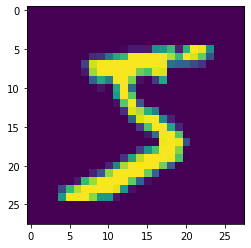

tensor(5)


In [9]:
import matplotlib.pyplot as plt
plt.imshow(X_train[0, :, :])
plt.show()
print(y_train[0])

In [10]:
X_train = X_train.reshape([-1, 28 * 28]) #превращаем двухмерный тензор в одномерный 
X_test = X_test.reshape([-1, 28 * 28])  #превращаем двухмерный тензор в одномерный 
X_train.shape, X_test.shape

(torch.Size([60000, 784]), torch.Size([10000, 784]))

In [11]:
class MNISTNet(torch.nn.Module):
    def __init__(self, n_hidden_neurons):
        super(MNISTNet, self).__init__()
        self.fc1 = torch.nn.Linear(28 * 28, n_hidden_neurons)
        self.ac1 = torch.nn.Sigmoid()
        self.fc2 = torch.nn.Linear(n_hidden_neurons, 10) 
    
    def forward(self, x):
        x = self.fc1(x)
        x = self.ac1(x)
        x = self.fc2(x)
        return x
    
mnist_net = MNISTNet(100)

In [12]:
torch.cuda.is_available()

True

In [12]:
import sys
!nvidia-smi

'nvidia-smi' is not recognized as an internal or external command,
operable program or batch file.


In [13]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
mnist_net = mnist_net.to(device)
list(mnist_net.parameters())

[Parameter containing:
 tensor([[-0.0003,  0.0192, -0.0294,  ...,  0.0219,  0.0037,  0.0021],
         [-0.0198, -0.0150, -0.0104,  ..., -0.0203, -0.0060, -0.0299],
         [-0.0201,  0.0149, -0.0333,  ..., -0.0203,  0.0012,  0.0080],
         ...,
         [ 0.0221,  0.0258, -0.0088,  ..., -0.0141,  0.0051, -0.0318],
         [-0.0217, -0.0136,  0.0185,  ..., -0.0012, -0.0012, -0.0017],
         [ 0.0142,  0.0089, -0.0053,  ...,  0.0311, -0.0181,  0.0020]],
        device='cuda:0', requires_grad=True), Parameter containing:
 tensor([-3.5402e-02,  1.8178e-02, -2.1709e-02, -1.1839e-02,  4.8722e-03,
         -1.0492e-02, -1.9008e-02,  2.6994e-02, -3.4899e-02,  1.0381e-02,
         -3.5228e-02, -5.6381e-03, -2.0134e-02, -3.0264e-02, -1.3289e-02,
          2.5346e-02, -1.0797e-02,  2.1568e-03,  4.3630e-03, -2.1916e-02,
          2.2670e-02, -1.5766e-02,  3.4906e-02, -2.3063e-02, -6.8216e-03,
          2.7051e-02, -1.3991e-02,  9.7218e-03, -9.9075e-04,  1.6625e-03,
          2.3455e-02, -2

In [14]:
loss = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(mnist_net.parameters(), lr=1.0e-3)

In [15]:
batch_size = 100

test_accuracy_history = []
test_loss_history = []

X_test = X_test.to(device)
y_test = y_test.to(device)

for epoch in range(20):
    order = np.random.permutation(len(X_train))
    
    for start_index in range(0, len(X_train), batch_size):
        optimizer.zero_grad()
        
        batch_indexes = order[start_index:start_index+batch_size]
        
        X_batch = X_train[batch_indexes].to(device)
        y_batch = y_train[batch_indexes].to(device)
        
        preds = mnist_net.forward(X_batch) 
        
        loss_value = loss(preds, y_batch)
        loss_value.backward()
        
        optimizer.step()

    test_preds = mnist_net.forward(X_test)
    test_loss_history.append(loss(test_preds, y_test))
    
    accuracy = (test_preds.argmax(dim=1) == y_test).float().mean()
    test_accuracy_history.append(accuracy)
    print(accuracy)

tensor(0.9067, device='cuda:0')
tensor(0.9161, device='cuda:0')
tensor(0.9184, device='cuda:0')
tensor(0.9171, device='cuda:0')
tensor(0.9237, device='cuda:0')
tensor(0.9182, device='cuda:0')
tensor(0.9165, device='cuda:0')
tensor(0.9309, device='cuda:0')
tensor(0.9270, device='cuda:0')
tensor(0.9285, device='cuda:0')
tensor(0.9334, device='cuda:0')
tensor(0.9312, device='cuda:0')
tensor(0.9308, device='cuda:0')
tensor(0.9362, device='cuda:0')
tensor(0.9364, device='cuda:0')
tensor(0.9358, device='cuda:0')
tensor(0.9389, device='cuda:0')
tensor(0.9362, device='cuda:0')
tensor(0.9303, device='cuda:0')
tensor(0.9413, device='cuda:0')


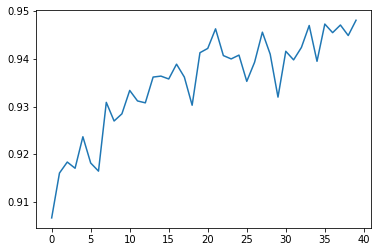

In [16]:
plt.plot(test_accuracy_history);

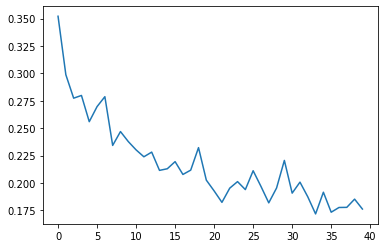

In [17]:
plt.plot(test_loss_history);

# 1.11 Сверточные нейронные сети

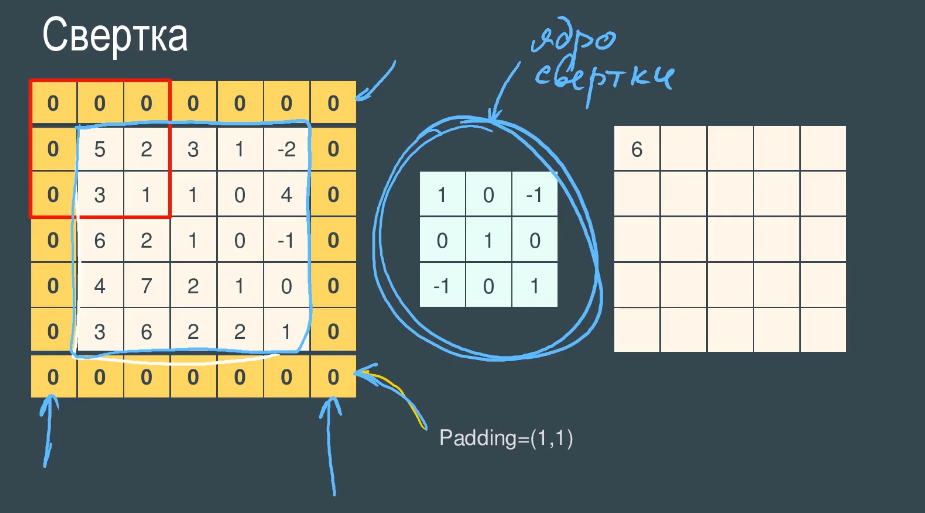

In [29]:
from IPython.display import Image #display picture
Image('svertka.png')

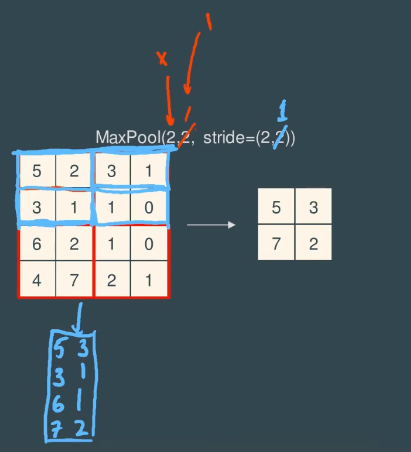

In [31]:
#MaxPooling
Image('pooling.png')

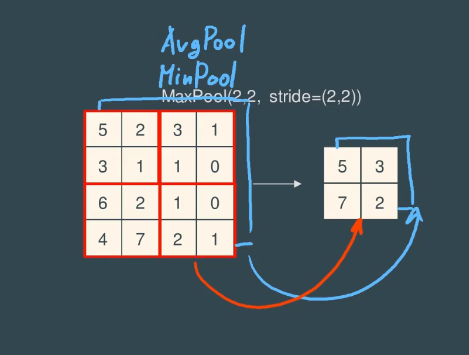

In [32]:
#MinPooling, AvgPooling
Image('pooling1.png')

# 1.12 архитектура LeNet (1998)

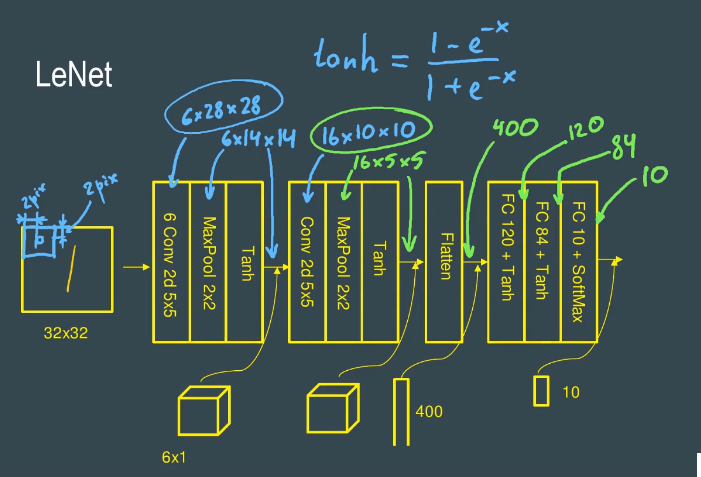

In [2]:
#Настраиваются 
#1)значения фильтров
#2)Значения смещений
#3)Функция потерь - кросс энтропия
#4)Оптимизатор - SGD или Adam (a = 10*e^-4, b)
from IPython.display import Image #display picture
Image('LeNet.png')

# 1.13 AlexNet (2012) и VGG (2014)

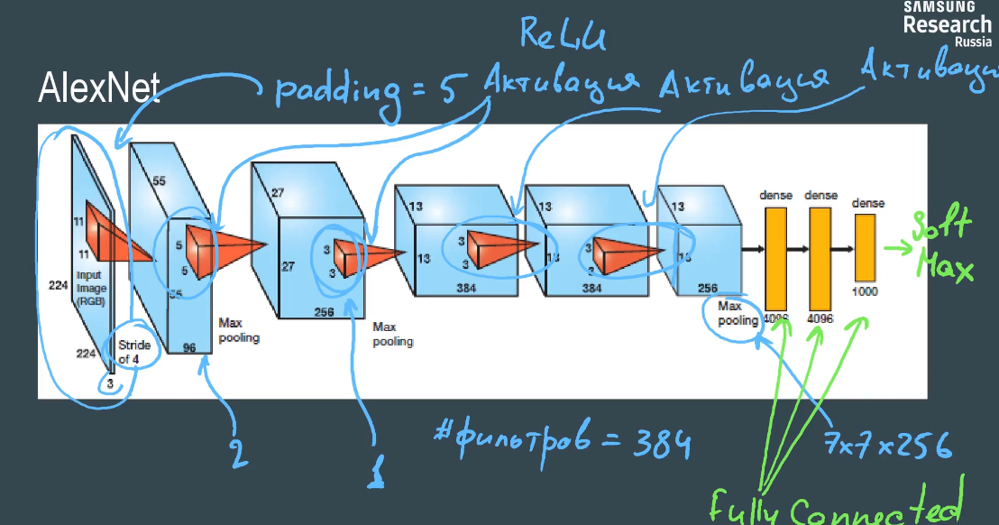

In [4]:
Image('AlexNet.png')

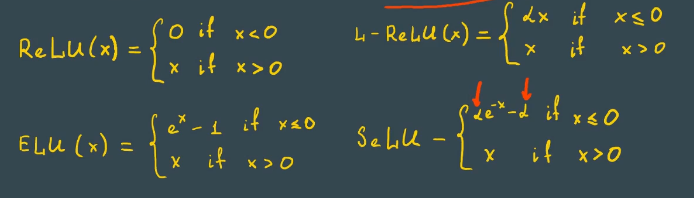

In [5]:
#Функция ReLU, ELU, L-ReLU, SeLU решают проблему затухания градиента при обратном распространении ошибки
Image('ReLU.png')

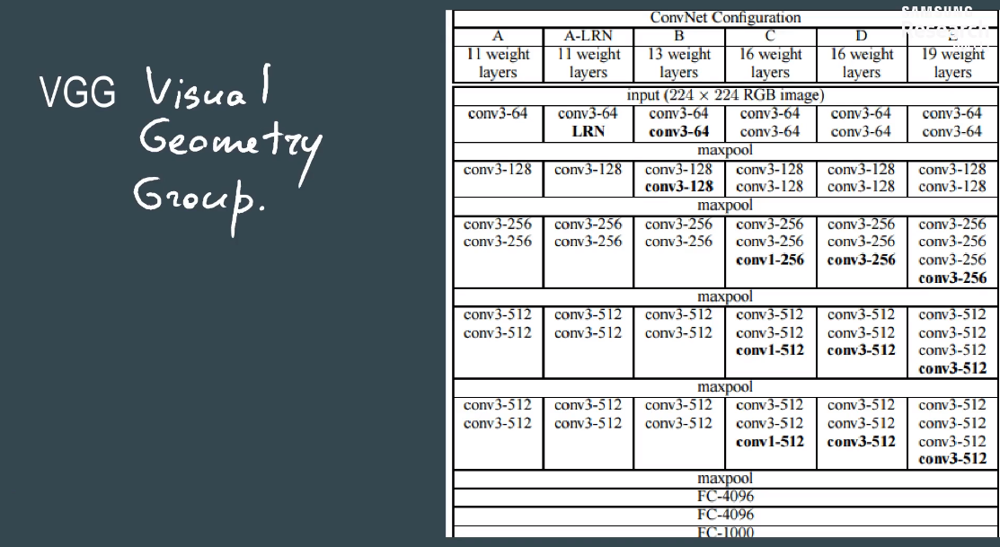

In [6]:
Image('VGG.png')

# 1.14 GoogLeNet и ResNet (2015)

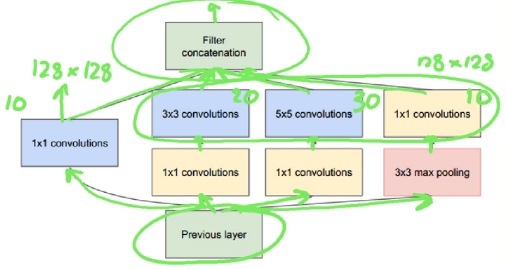

In [7]:
Image('inception_01.png')

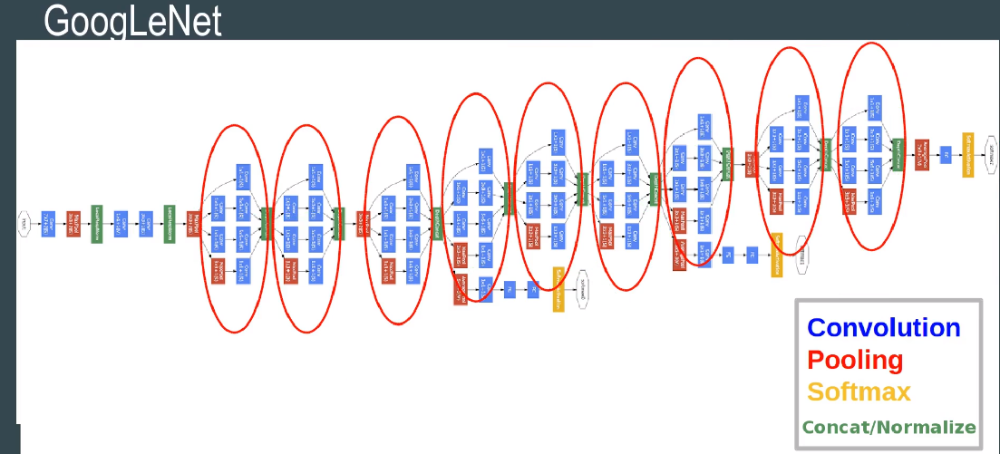

In [8]:
Image('googlenet.png')

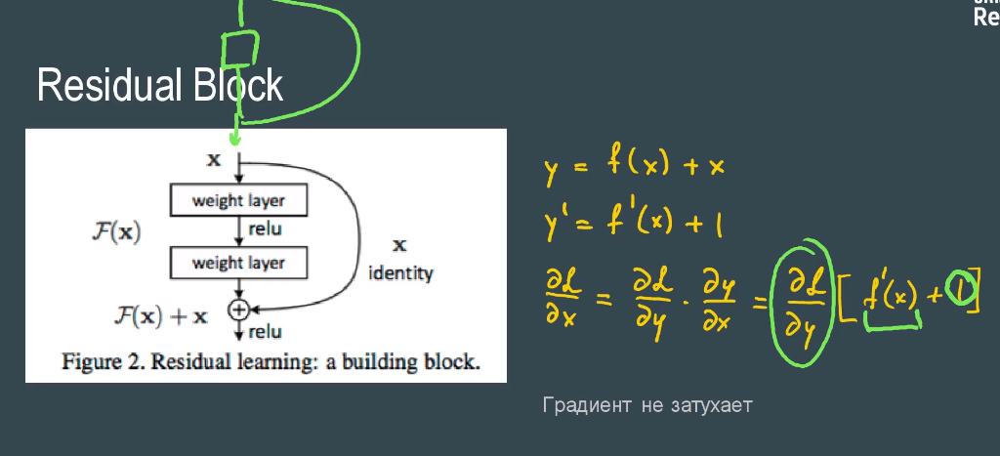

In [10]:
Image('Residual-block.png')

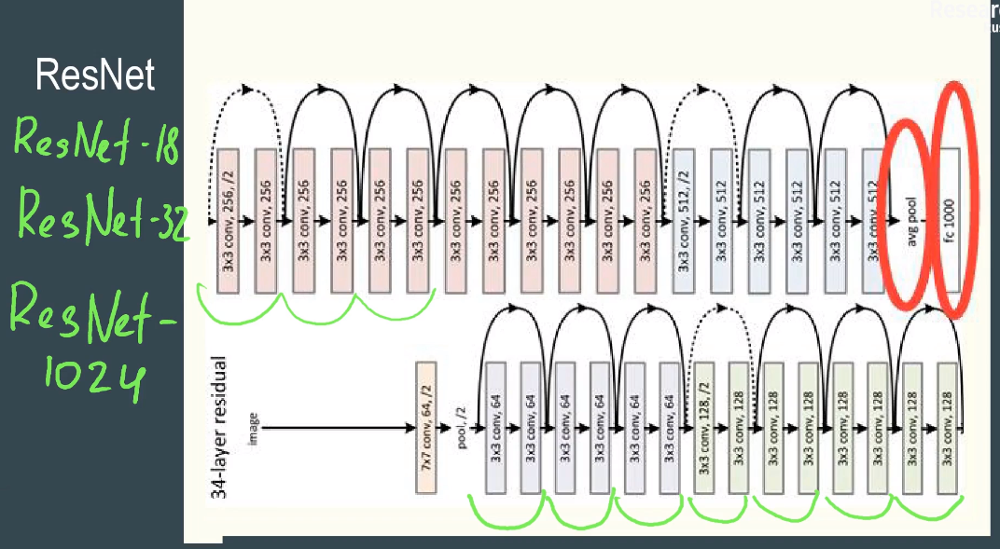

In [9]:
#ResNet
Image('ResNet.png')

# 1.15 Распознавание рукописных чисел сверточной нейросетью

![alt text](https://engmrk.com/wp-content/uploads/2018/09/LeNet_Original_Image.jpg)

![alt text](https://engmrk.com/wp-content/uploads/2018/09/LeNEt_Summary_Table.jpg)

In [2]:
import torch
import random
import numpy as np

random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.deterministic = True

In [3]:
import torchvision.datasets

In [4]:
MNIST_train = torchvision.datasets.MNIST('./', download=True, train=True)
MNIST_test = torchvision.datasets.MNIST('./', download=True, train=False)

In [6]:
X_train = MNIST_train.data
y_train = MNIST_train.targets
X_test = MNIST_test.data
y_test = MNIST_test.targets

In [7]:
len(y_train), len(y_test)

(60000, 10000)

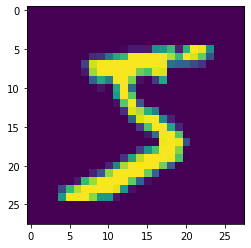

tensor(5)


In [9]:
import matplotlib.pyplot as plt
plt.imshow(X_train[0, :, :])
plt.show()
print(y_train[0])

In [10]:
X_train = X_train.unsqueeze(1).float() #меняем размерность
X_test = X_test.unsqueeze(1).float()

In [11]:
X_train.shape

torch.Size([60000, 1, 28, 28])

In [13]:
class LeNet5(torch.nn.Module):
    def __init__(self):
        super(LeNet5, self).__init__()
        
        self.conv1 = torch.nn.Conv2d(
            in_channels=1, out_channels=6, kernel_size=5, padding=2)
        self.act1  = torch.nn.Tanh()
        self.pool1 = torch.nn.AvgPool2d(kernel_size=2, stride=2)
       
        self.conv2 = torch.nn.Conv2d(
            in_channels=6, out_channels=16, kernel_size=5, padding=0)
        self.act2  = torch.nn.Tanh()
        self.pool2 = torch.nn.AvgPool2d(kernel_size=2, stride=2)
        
        self.fc1   = torch.nn.Linear(5 * 5 * 16, 120)
        self.act3  = torch.nn.Tanh()
        
        self.fc2   = torch.nn.Linear(120, 84)
        self.act4  = torch.nn.Tanh()
        
        self.fc3   = torch.nn.Linear(84, 10)
    
    def forward(self, x):
        
        x = self.conv1(x)
        x = self.act1(x)
        x = self.pool1(x)
        
        x = self.conv2(x)
        x = self.act2(x)
        x = self.pool2(x)
        
        x = x.view(x.size(0), x.size(1) * x.size(2) * x.size(3)) #получаем тензор 400

        x = self.fc1(x)
        x = self.act3(x)
        x = self.fc2(x)
        x = self.act4(x)
        x = self.fc3(x)
        
        return x
    
lenet5 = LeNet5()

In [23]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
lenet5 = lenet5.to(device)

In [24]:
loss = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(lenet5.parameters(), lr=1.0e-3)

In [25]:
batch_size = 100

test_accuracy_history = []
test_loss_history = []

X_test = X_test.to(device)
y_test = y_test.to(device)

for epoch in range(20):
    order = np.random.permutation(len(X_train))
    for start_index in range(0, len(X_train), batch_size):
        optimizer.zero_grad()
        
        batch_indexes = order[start_index:start_index+batch_size]
        
        X_batch = X_train[batch_indexes].to(device)
        y_batch = y_train[batch_indexes].to(device)
        
        preds = lenet5.forward(X_batch) 
        
        loss_value = loss(preds, y_batch)
        loss_value.backward()
        
        optimizer.step()
        
    test_preds = lenet5.forward(X_test)
    test_loss_history.append(loss(test_preds, y_test).data.cpu())
    
    accuracy = (test_preds.argmax(dim=1) == y_test).float().mean().data.cpu()
    test_accuracy_history.append(accuracy)
    
    print(accuracy)

tensor(0.9905)
tensor(0.9865)
tensor(0.9888)
tensor(0.9895)
tensor(0.9870)
tensor(0.9901)
tensor(0.9883)
tensor(0.9885)
tensor(0.9889)
tensor(0.9888)
tensor(0.9886)
tensor(0.9890)
tensor(0.9885)
tensor(0.9874)
tensor(0.9891)
tensor(0.9863)
tensor(0.9889)
tensor(0.9872)
tensor(0.9888)
tensor(0.9870)


In [ ]:
lenet5.forward(X_test)

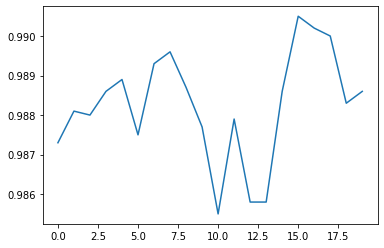

In [18]:
plt.plot(test_accuracy_history);

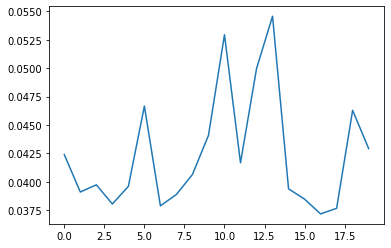

In [19]:
plt.plot(test_loss_history);

In [ ]:
#Замена сверток 5x5 на две свертки 3x3 + замена avg-пулингов на max-пулинги + небольшое увеличение 
#количества каналов у сверточных слоев + замена tanh на ReLU + еще один полносвязный слой + размер батча 
#1000 + скорость обучения 1e-4.
#После 80-й эпохи стабильно выдает accuracy 0.9925±0.0004 и дальше потихоньку переобучается.

# 1.16 Регуляризация и нормализация (переобучение, дропаут)

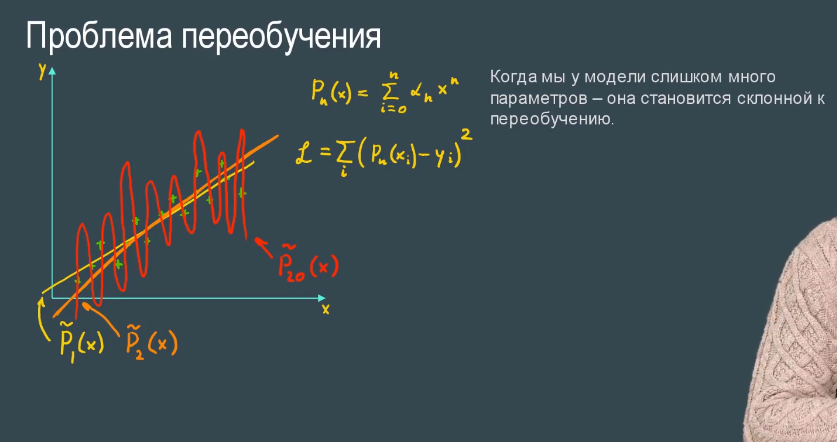

In [4]:
#Ограничение степеней полинома
Image('simpler-model.png')

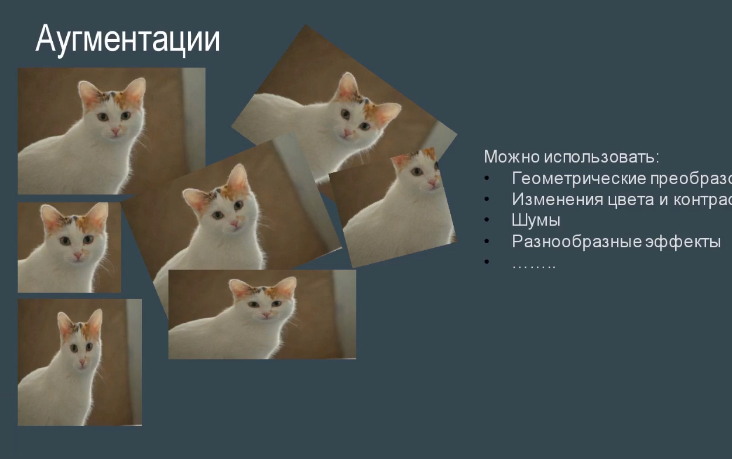

In [1]:
#Аугментация - искуственное расширение выборки для лучшего обучения модели
from IPython.display import Image #display picture
Image('augment.png')

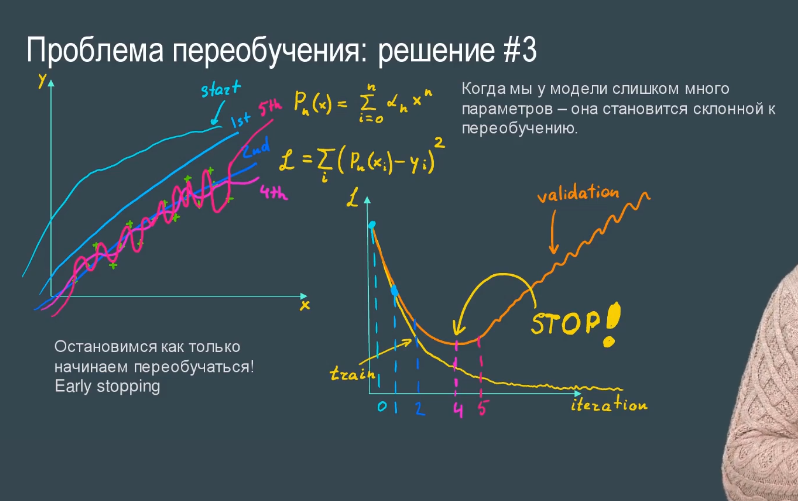

In [2]:
#Early-stoping
from IPython.display import Image #display picture
Image('Early-stopping.png')

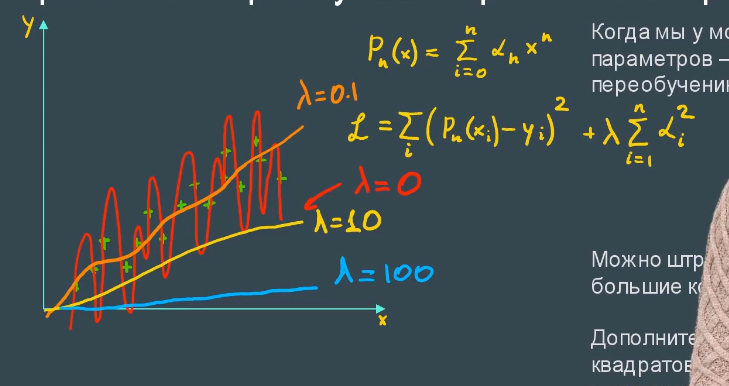

In [3]:
#Регуляризация
Image('regularization.png')

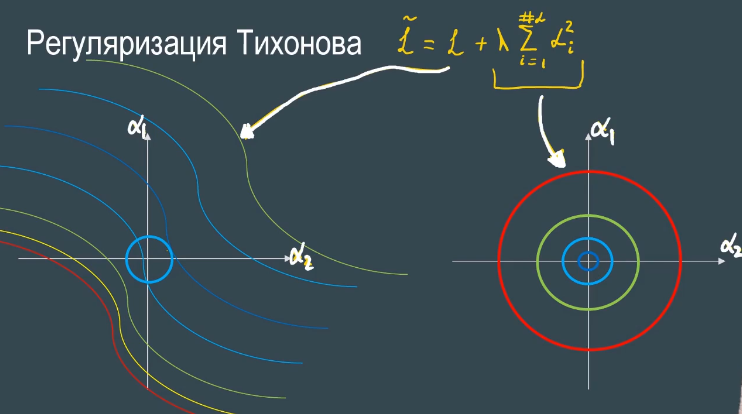

In [2]:
#Лямбда - коэффициент регуляризации
#a - параметры модели
Image('Tikhonov-regularization.png')

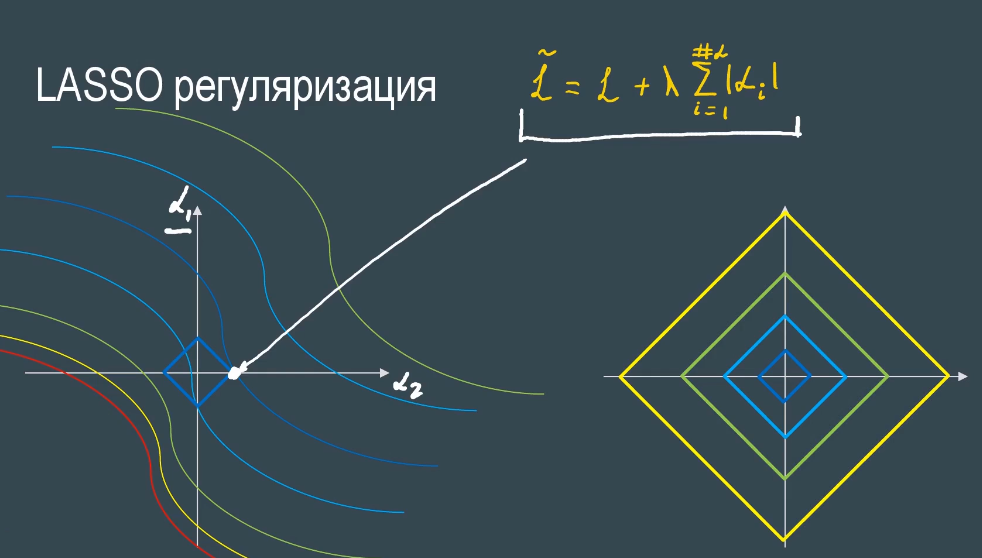

In [1]:
#Lasso регуляризация (зануляет некоторые параметры модели)
from IPython.display import Image #display picture
Image('lasso.png')

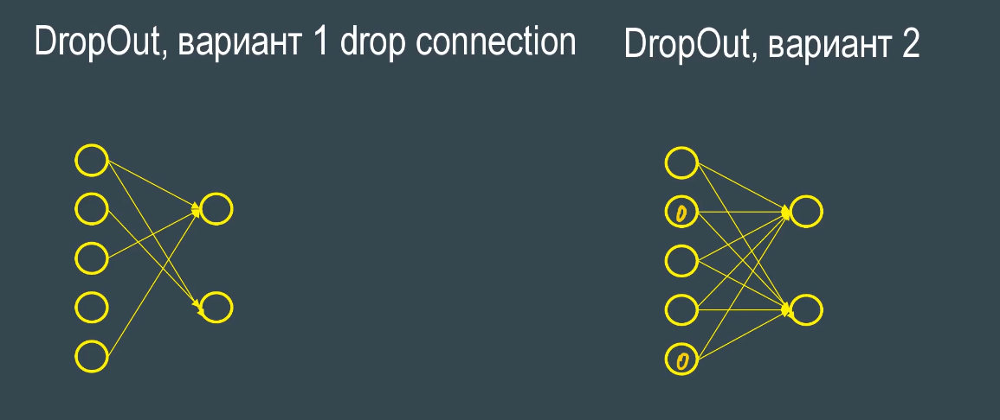

In [3]:
#DropOut1 с вероятностным параметром P, с определенной вероятностью сбрасывает соединения между нейронами
#DropOut2 с вероятностным параметром p, с определенной вероятностью зануляет нейрон
Image('dropout.png')

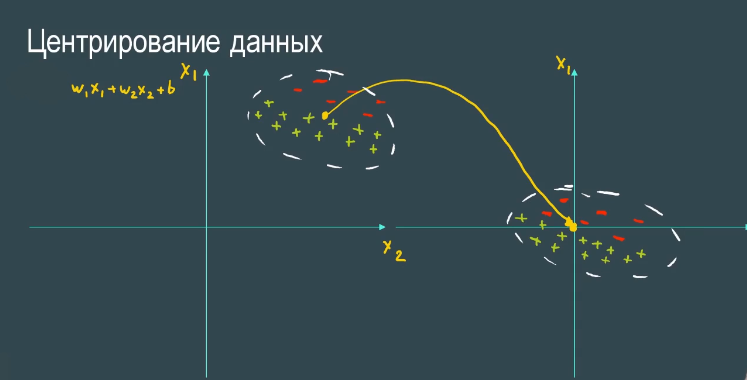

In [4]:
#централизация данных для ускорения обучения модели
Image('centralization.png')

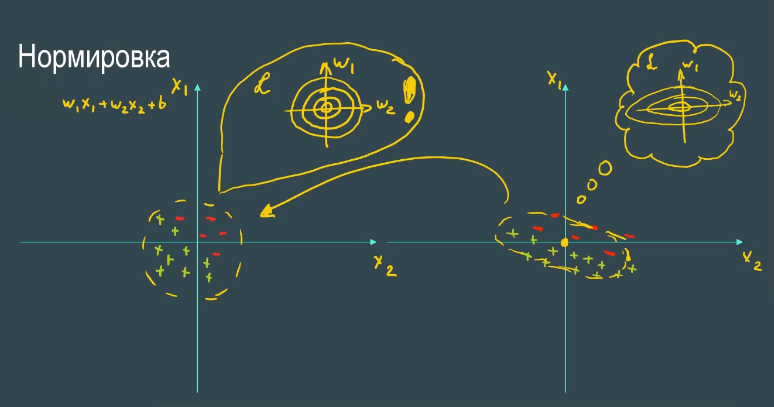

In [5]:
Image('normalization.png')

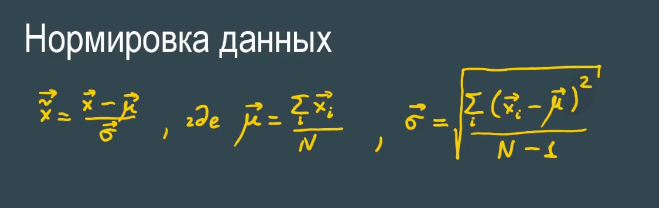

In [6]:
#Нормировка данных
Image('normalization1.png')

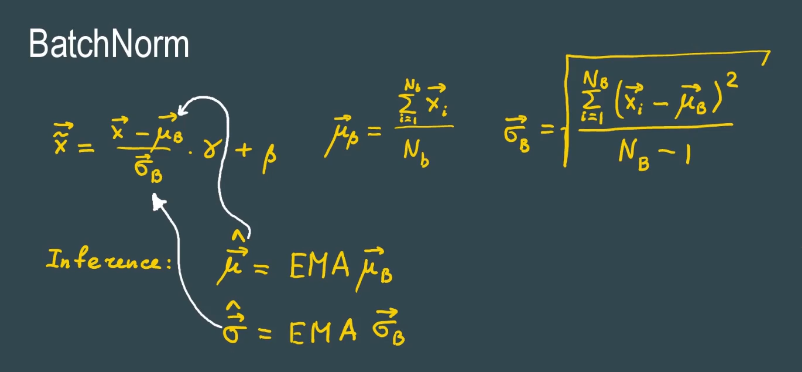

In [8]:
#Нормализация батчей
#Гамма и бетта обучаются вместе со всей нейронной сетью
#С заменой части статистики на уже посчитанную при валидации
#Во время тренировки батч-нормализация оценивает статистики по одному батчу, а во время валидации используются 
#усредненные статистики по всей истории обучения
Image('batchnorm.png')

# 1.17 Модификация сети LeNet5 для MNIST 

![alt text](https://engmrk.com/wp-content/uploads/2018/09/LeNet_Original_Image.jpg)

![alt text](https://engmrk.com/wp-content/uploads/2018/09/LeNEt_Summary_Table.jpg)

In [95]:
import torch
import random
import numpy as np

random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.deterministic = True

In [96]:
import torchvision.datasets

In [97]:
MNIST_train = torchvision.datasets.MNIST('./', download=True, train=True)
MNIST_test = torchvision.datasets.MNIST('./', download=True, train=False)

In [98]:
X_train = MNIST_train.data
y_train = MNIST_train.targets
X_test = MNIST_test.data
y_test = MNIST_test.targets

In [99]:
len(y_train), len(y_test)

(60000, 10000)

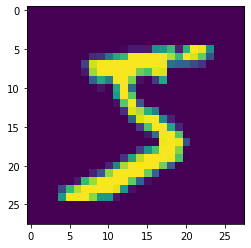

tensor(5)


In [100]:
import matplotlib.pyplot as plt
plt.imshow(X_train[0, :, :])
plt.show()
print(y_train[0])

In [101]:
X_train = X_train.unsqueeze(1).float()
X_test = X_test.unsqueeze(1).float()

In [102]:
X_train.shape

torch.Size([60000, 1, 28, 28])

In [103]:
class LeNet5(torch.nn.Module):
    def __init__(self,
                 activation='tanh',
                 pooling='avg',
                 conv_size=5,
                 use_batch_norm=False):
        super(LeNet5, self).__init__()
        
        self.conv_size = conv_size
        self.use_batch_norm = use_batch_norm
        
        if activation == 'tanh':
            activation_function = torch.nn.Tanh()
        elif activation == 'relu':
            activation_function  = torch.nn.ReLU()
        else:
            raise NotImplementedError
            
        if pooling == 'avg':
            pooling_layer = torch.nn.AvgPool2d(kernel_size=2, stride=2)
        elif pooling == 'max':
            pooling_layer  = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        else:
            raise NotImplementedError
        
        if conv_size == 5:
            self.conv1 = torch.nn.Conv2d(
                in_channels=1, out_channels=6, kernel_size=5, padding=2)
        elif conv_size == 3:
            self.conv1_1 = torch.nn.Conv2d(
                in_channels=1, out_channels=6, kernel_size=3, padding=1)
            self.conv1_2 = torch.nn.Conv2d(
                in_channels=6, out_channels=6, kernel_size=3, padding=1)
        else:
            raise NotImplementedError

        self.act1 = activation_function
        self.bn1 = torch.nn.BatchNorm2d(num_features=6)
        self.pool1 = pooling_layer
       
        if conv_size == 5:
            self.conv2 = self.conv2 = torch.nn.Conv2d(
                in_channels=6, out_channels=16, kernel_size=5, padding=0)
        elif conv_size == 3:
            self.conv2_1 = torch.nn.Conv2d(
                in_channels=6, out_channels=16, kernel_size=3, padding=0)
            self.conv2_2 = torch.nn.Conv2d(
                in_channels=16, out_channels=16, kernel_size=3, padding=0)
        else:
            raise NotImplementedError

        self.act2 = activation_function
        self.bn2 = torch.nn.BatchNorm2d(num_features=16)
        self.pool2 = pooling_layer
        
        self.fc1 = torch.nn.Linear(5 * 5 * 16, 120)
        self.act3 = activation_function
    
        self.fc2 = torch.nn.Linear(120, 84)
        self.act4 = activation_function
        
        self.fc3 = torch.nn.Linear(84, 10)
    
    def forward(self, x):
        if self.conv_size == 5:
            x = self.conv1(x)
        elif self.conv_size == 3:
            x = self.conv1_2(self.conv1_1(x))
        x = self.act1(x)
        if self.use_batch_norm:
            x = self.bn1(x)
        x = self.pool1(x)
        
        if self.conv_size == 5:
            x = self.conv2(x)
        elif self.conv_size == 3:
            x = self.conv2_2(self.conv2_1(x))
        x = self.act2(x)
        if self.use_batch_norm:
            x = self.bn2(x)
        x = self.pool2(x)
        
        x = x.view(x.size(0), x.size(1) * x.size(2) * x.size(3))
        x = self.fc1(x)
        x = self.act3(x)
        x = self.fc2(x)
        x = self.act4(x)
        x = self.fc3(x)
        
        return x

In [104]:
def train(net, X_train, y_train, X_test, y_test):
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    net = net.to(device)
    loss = torch.nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=1.0e-3)
    
    batch_size = 100

    test_accuracy_history = []
    test_loss_history = []

    X_test = X_test.to(device)
    y_test = y_test.to(device)

    for epoch in range(30):
        order = np.random.permutation(len(X_train))
        for start_index in range(0, len(X_train), batch_size):
            optimizer.zero_grad()
            net.train()

            batch_indexes = order[start_index:start_index+batch_size]

            X_batch = X_train[batch_indexes].to(device)
            y_batch = y_train[batch_indexes].to(device)

            preds = net.forward(X_batch) 

            loss_value = loss(preds, y_batch)
            loss_value.backward()

            optimizer.step()
            

        net.eval()
        test_preds = net.forward(X_test)
        test_loss_history.append(loss(test_preds, y_test).data.cpu())

        accuracy = (test_preds.argmax(dim=1) == y_test).float().mean().data.cpu()
        test_accuracy_history.append(accuracy)

        print(accuracy)
        del test_preds
    print('---------------')
    return test_accuracy_history, test_loss_history

accuracies = {}
losses = {}


accuracies['tanh'], losses['tanh'] = \
    train(LeNet5(activation='tanh', conv_size=5),
          X_train, y_train, X_test, y_test)

accuracies['relu'], losses['relu'] = \
    train(LeNet5(activation='relu', conv_size=5),
          X_train, y_train, X_test, y_test)

accuracies['relu_3'], losses['relu_3'] = \
    train(LeNet5(activation='relu', conv_size=3),
          X_train, y_train, X_test, y_test)

accuracies['relu_3_max_pool'], losses['relu_3_max_pool'] = \
    train(LeNet5(activation='relu', conv_size=3, pooling='max'), 
          X_train, y_train, X_test, y_test)

accuracies['relu_3_max_pool_bn'], losses['relu_3_max_pool_bn'] = \
    train(LeNet5(activation='relu', conv_size=3, pooling='max', use_batch_norm=True), 
          X_train, y_train, X_test, y_test)

tensor(0.9763)
tensor(0.9830)
tensor(0.9856)
tensor(0.9880)
tensor(0.9884)
tensor(0.9877)
tensor(0.9871)
tensor(0.9879)
tensor(0.9877)
tensor(0.9879)
tensor(0.9888)
tensor(0.9898)
tensor(0.9874)
tensor(0.9878)
tensor(0.9895)
tensor(0.9872)
tensor(0.9894)
tensor(0.9897)
tensor(0.9882)
tensor(0.9897)
tensor(0.9885)
tensor(0.9901)
tensor(0.9886)
tensor(0.9870)
tensor(0.9907)
tensor(0.9904)
tensor(0.9899)
tensor(0.9895)
tensor(0.9888)
tensor(0.9895)
---------------
tensor(0.9826)
tensor(0.9874)
tensor(0.9888)
tensor(0.9871)
tensor(0.9884)
tensor(0.9903)
tensor(0.9876)
tensor(0.9895)
tensor(0.9903)
tensor(0.9886)
tensor(0.9902)
tensor(0.9898)
tensor(0.9908)
tensor(0.9908)
tensor(0.9886)
tensor(0.9898)
tensor(0.9921)
tensor(0.9905)
tensor(0.9911)
tensor(0.9891)
tensor(0.9918)
tensor(0.9886)
tensor(0.9914)
tensor(0.9926)
tensor(0.9907)
tensor(0.9911)
tensor(0.9900)
tensor(0.9901)
tensor(0.9890)
tensor(0.9924)
---------------
tensor(0.9808)
tensor(0.9861)
tensor(0.9853)
tensor(0.9817)
tensor(0

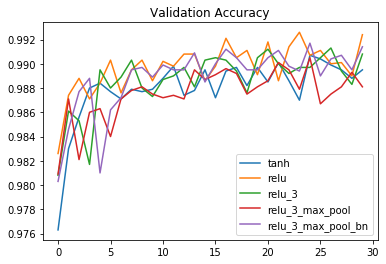

In [105]:
for experiment_id in accuracies.keys():
    plt.plot(accuracies[experiment_id], label=experiment_id)
plt.legend()
plt.title('Validation Accuracy');

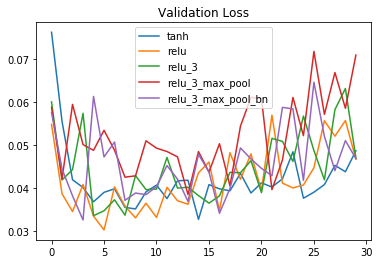

In [106]:
for experiment_id in losses.keys():
    plt.plot(losses[experiment_id], label=experiment_id)
plt.legend()
plt.title('Validation Loss');

# 1.18 Сеть LeNet5 и CIFARNet для датасета CIFAR

![alt text](https://engmrk.com/wp-content/uploads/2018/09/LeNet_Original_Image.jpg)

![alt text](https://engmrk.com/wp-content/uploads/2018/09/LeNEt_Summary_Table.jpg)

In [1]:
import torch
import random
import numpy as np

random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.deterministic = True

In [2]:
import torchvision.datasets

In [3]:
CIFAR_train = torchvision.datasets.CIFAR10('./', download=True, train=True)
CIFAR_test = torchvision.datasets.CIFAR10('./', download=True, train=False)

Files already downloaded and verified
Files already downloaded and verified


In [4]:
X_train = torch.FloatTensor(CIFAR_train.data)
y_train = torch.LongTensor(CIFAR_train.targets)
X_test = torch.FloatTensor(CIFAR_test.data)
y_test = torch.LongTensor(CIFAR_test.targets)

In [5]:
len(y_train), len(y_test)

(50000, 10000)

In [6]:
X_train.min(), X_train.max()

(tensor(0.), tensor(255.))

In [7]:
X_train /= 255.
X_test /= 255.

In [8]:
CIFAR_train.classes

['airplane',
 'automobile',
 'bird',
 'cat',
 'deer',
 'dog',
 'frog',
 'horse',
 'ship',
 'truck']

tensor(6) tensor(9) tensor(9) tensor(4) tensor(1) tensor(1) tensor(2) tensor(7) tensor(8) tensor(3) 

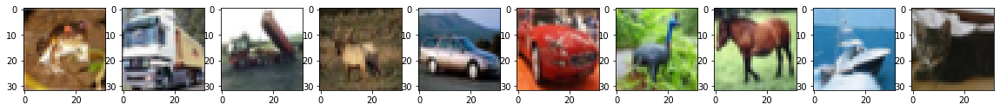

In [10]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,2))
for i in range(10):
    plt.subplot(1, 10, i+1)
    plt.imshow(X_train[i])
    print(y_train[i], end=' ')

In [11]:
X_train.shape, y_train.shape

(torch.Size([50000, 32, 32, 3]), torch.Size([50000]))

In [12]:
X_train = X_train.permute(0, 3, 1, 2)
X_test = X_test.permute(0, 3, 1, 2)

In [13]:
X_train.shape

torch.Size([50000, 3, 32, 32])

In [14]:
class LeNet5(torch.nn.Module):
    def __init__(self,
                 activation='tanh',
                 pooling='avg',
                 conv_size=5, 
                 use_batch_norm=False):
        super(LeNet5, self).__init__()
        
        self.conv_size = conv_size
        self.use_batch_norm = use_batch_norm
        
        if activation == 'tanh':
            activation_function = torch.nn.Tanh()
        elif activation == 'relu':
            activation_function  = torch.nn.ReLU()
        else:
            raise NotImplementedError
            
        if pooling == 'avg':
            pooling_layer = torch.nn.AvgPool2d(kernel_size=2, stride=2)
        elif pooling == 'max':
            pooling_layer  = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        else:
            raise NotImplementedError
        
        if conv_size == 5:
            self.conv1 = torch.nn.Conv2d(
                in_channels=3, out_channels=6, kernel_size=5, padding=0)
        elif conv_size == 3:
            self.conv1_1 = torch.nn.Conv2d(
                in_channels=3, out_channels=6, kernel_size=3, padding=0)
            self.conv1_2 = torch.nn.Conv2d(
                in_channels=6, out_channels=6, kernel_size=3, padding=0)
        else:
            raise NotImplementedError

        self.act1 = activation_function
        self.bn1 = torch.nn.BatchNorm2d(num_features=6)
        self.pool1 = pooling_layer
       
        if conv_size == 5:
            self.conv2 = self.conv2 = torch.nn.Conv2d(
                in_channels=6, out_channels=16, kernel_size=5, padding=0)
        elif conv_size == 3:
            self.conv2_1 = torch.nn.Conv2d(
                in_channels=6, out_channels=16, kernel_size=3, padding=0)
            self.conv2_2 = torch.nn.Conv2d(
                in_channels=16, out_channels=16, kernel_size=3, padding=0)
        else:
            raise NotImplementedError

        self.act2 = activation_function
        self.bn2 = torch.nn.BatchNorm2d(num_features=16)
        self.pool2 = pooling_layer
        
        self.fc1 = torch.nn.Linear(5 * 5 * 16, 120)
        self.act3 = activation_function
    
        self.fc2 = torch.nn.Linear(120, 84)
        self.act4 = activation_function
        
        self.fc3 = torch.nn.Linear(84, 10)
    
    def forward(self, x):
        if self.conv_size == 5:
            x = self.conv1(x)
        elif self.conv_size == 3:
            x = self.conv1_2(self.conv1_1(x))
        x = self.act1(x)
        if self.use_batch_norm:
            x = self.bn1(x)
        x = self.pool1(x)
        
        if self.conv_size == 5:
            x = self.conv2(x)
        elif self.conv_size == 3:
            x = self.conv2_2(self.conv2_1(x))
        x = self.act2(x)
        if self.use_batch_norm:
            x = self.bn2(x)
        x = self.pool2(x)
        
        x = x.view(x.size(0), x.size(1) * x.size(2) * x.size(3))
        x = self.fc1(x)
        x = self.act3(x)
        x = self.fc2(x)
        x = self.act4(x)
        x = self.fc3(x)
        
        return x

In [15]:
def train(net, X_train, y_train, X_test, y_test):
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    net = net.to(device)
    loss = torch.nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=1.0e-3)
    
    batch_size = 100

    test_accuracy_history = []
    test_loss_history = []

    X_test = X_test.to(device)
    y_test = y_test.to(device)

    for epoch in range(30):
        order = np.random.permutation(len(X_train))
        for start_index in range(0, len(X_train), batch_size):
            optimizer.zero_grad()
            net.train()

            batch_indexes = order[start_index:start_index+batch_size]

            X_batch = X_train[batch_indexes].to(device)
            y_batch = y_train[batch_indexes].to(device)

            preds = net.forward(X_batch)

            loss_value = loss(preds, y_batch)
            loss_value.backward()

            optimizer.step()
            
            X_batch

        net.eval()
        test_preds = net.forward(X_test)
        test_loss_history.append(loss(test_preds, y_test).data.cpu())

        accuracy = (test_preds.argmax(dim=1) == y_test).float().mean().data.cpu()
        test_accuracy_history.append(accuracy)

        print(accuracy)
        del test_preds
    del net
    return test_accuracy_history, test_loss_history

accuracies = {}
losses = {}

accuracies['tanh'], losses['tanh'] = \
    train(LeNet5(activation='tanh', conv_size=5),
          X_train, y_train, X_test, y_test)
accuracies['relu'], losses['relu'] = \
    train(LeNet5(activation='relu', conv_size=5),
          X_train, y_train, X_test, y_test)
accuracies['relu_3'], losses['relu_3'] = \
    train(LeNet5(activation='relu', conv_size=3),
          X_train, y_train, X_test, y_test)
accuracies['relu_3_max_pool'], losses['relu_3_max_pool'] = \
    train(LeNet5(activation='relu', conv_size=3, pooling='max'), 
          X_train, y_train, X_test, y_test)
accuracies['relu_3_max_pool_bn'], losses['relu_3_max_pool_bn'] = \
    train(LeNet5(activation='relu', conv_size=3, pooling='max', use_batch_norm=True), 
          X_train, y_train, X_test, y_test)

tensor(0.3876)
tensor(0.4334)
tensor(0.4709)
tensor(0.4962)
tensor(0.4969)
tensor(0.5182)
tensor(0.5263)
tensor(0.5363)
tensor(0.5425)
tensor(0.5401)
tensor(0.5461)
tensor(0.5455)
tensor(0.5432)
tensor(0.5542)
tensor(0.5565)
tensor(0.5588)
tensor(0.5550)
tensor(0.5537)
tensor(0.5534)
tensor(0.5523)
tensor(0.5545)
tensor(0.5500)
tensor(0.5449)
tensor(0.5490)
tensor(0.5471)
tensor(0.5472)
tensor(0.5427)
tensor(0.5429)
tensor(0.5394)
tensor(0.5422)
tensor(0.4266)
tensor(0.4809)
tensor(0.4822)
tensor(0.5204)
tensor(0.5299)
tensor(0.5445)
tensor(0.5572)
tensor(0.5616)
tensor(0.5759)
tensor(0.5746)
tensor(0.5902)
tensor(0.5861)
tensor(0.5978)
tensor(0.6053)
tensor(0.5967)
tensor(0.6022)
tensor(0.5938)
tensor(0.6092)
tensor(0.5957)
tensor(0.5975)
tensor(0.6091)
tensor(0.6125)
tensor(0.6191)
tensor(0.6171)
tensor(0.6094)
tensor(0.6232)
tensor(0.6102)
tensor(0.6162)
tensor(0.6092)
tensor(0.6130)
tensor(0.3650)
tensor(0.4648)
tensor(0.5005)
tensor(0.5170)
tensor(0.5278)
tensor(0.5447)
tensor(0.5

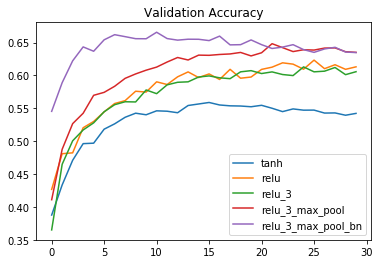

In [18]:
for experiment_id in accuracies.keys():
    plt.plot(accuracies[experiment_id], label=experiment_id)
plt.legend()
plt.title('Validation Accuracy');

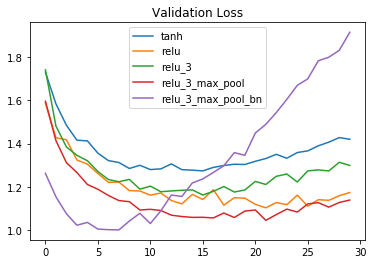

In [19]:
for experiment_id in losses.keys():
    plt.plot(losses[experiment_id], label=experiment_id)
plt.legend()
plt.title('Validation Loss');

In [0]:
class CIFARNet(torch.nn.Module):
    def __init__(self):
        super(CIFARNet, self).__init__()
        self.batch_norm0 = torch.nn.BatchNorm2d(3)

        self.conv1 = torch.nn.Conv2d(3, 16, 3, padding=1)
        self.act1  = torch.nn.ReLU()
        self.batch_norm1 = torch.nn.BatchNorm2d(16)
        self.pool1 = torch.nn.MaxPool2d(2, 2)
        
        self.conv2 = torch.nn.Conv2d(16, 32, 3, padding=1)
        self.act2  = torch.nn.ReLU()
        self.batch_norm2 = torch.nn.BatchNorm2d(32)
        self.pool2 = torch.nn.MaxPool2d(2, 2)
        
        self.conv3 = torch.nn.Conv2d(32, 64, 3, padding=1)
        self.act3  = torch.nn.ReLU()
        self.batch_norm3 = torch.nn.BatchNorm2d(64)

        self.fc1   = torch.nn.Linear(8 * 8 * 64, 256)
        self.act4  = torch.nn.Tanh()
        self.batch_norm4 = torch.nn.BatchNorm1d(256)
        
        self.fc2   = torch.nn.Linear(256, 64)
        self.act5  = torch.nn.Tanh()
        self.batch_norm5 = torch.nn.BatchNorm1d(64)
        
        self.fc3   = torch.nn.Linear(64, 10)
    
    def forward(self, x):
        x = self.batch_norm0(x)
        x = self.conv1(x)
        x = self.act1(x)
        x = self.batch_norm1(x)
        x = self.pool1(x)
        
        x = self.conv2(x)
        x = self.act2(x)
        x = self.batch_norm2(x)
        x = self.pool2(x)
        
        x = self.conv3(x)
        x = self.act3(x)
        x = self.batch_norm3(x)
        
        x = x.view(x.size(0), x.size(1) * x.size(2) * x.size(3))
        x = self.fc1(x)
        x = self.act4(x)
        x = self.batch_norm4(x)
        x = self.fc2(x)
        x = self.act5(x)
        x = self.batch_norm5(x)
        x = self.fc3(x)
        
        return x

In [2]:
accuracies['cifar_net'], losses['cifar_net'] = \
    train(CIFARNet(), X_train, y_train, X_test, y_test)

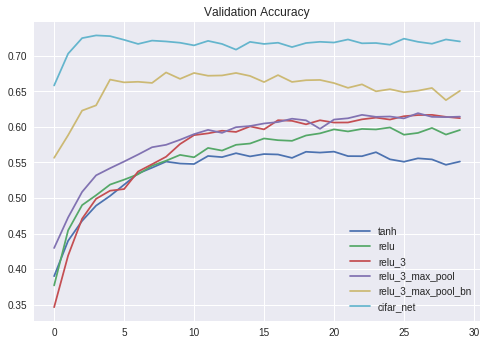

In [0]:
for experiment_id in accuracies.keys():
    plt.plot(accuracies[experiment_id], label=experiment_id)
plt.legend()
plt.title('Validation Accuracy');

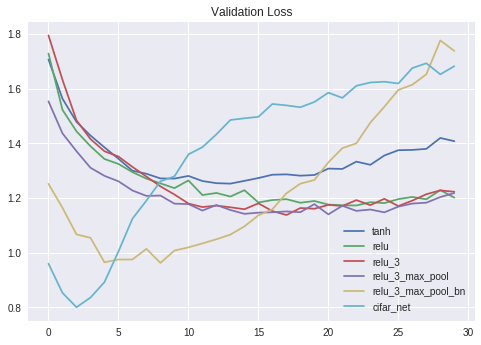

In [0]:
for experiment_id in losses.keys():
    plt.plot(losses[experiment_id], label=experiment_id)
plt.legend()
plt.title('Validation Loss');

# 1.19 Метод максимального правдоподобия

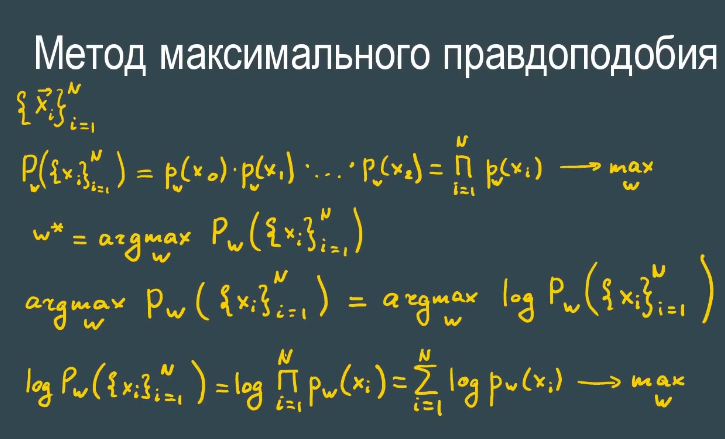

In [1]:
#Максимизация суммы логорифмов вероятностей наблюдений
from IPython.display import Image #display picture
Image('MMP.png')

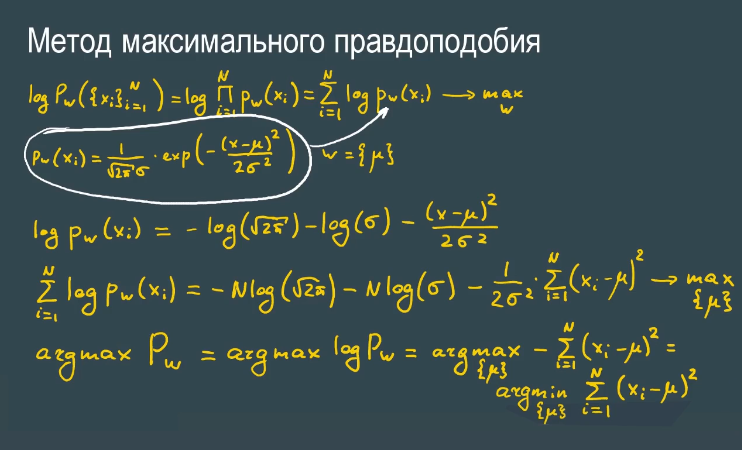

In [2]:
#Выражаем вероятность и подставляем её в логорифм, получаем задачу минимизации функции потерь
Image('MMP1.png')

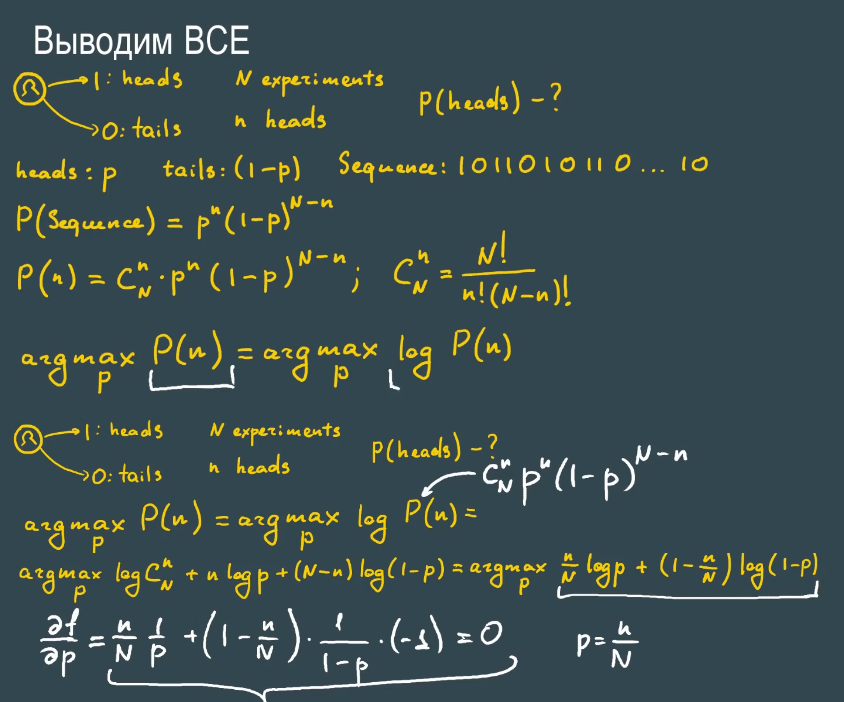

In [5]:
#Вывод BCE (бинарной кросс-энтропии)
#Нахождение экстремума функции
Image('BCE.png')

Пусть некоторая случайная величина $\xi$ распределена согласно некоторому распределению $p(\xi)$. Допустим, что мы произвели $M$ независимых замеров этой случайной величины $\xi_1, \dots, \xi_M$. Чему равна вероятность наблюдения именно этой выборки?

Произведение по всем i обозначайте как prod_i, $\xi_i$ обозначайте как x_i.

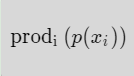

In [3]:
Image('formula5.png')

Рассмотрим следующий процесс: мы замеряем некоторую величину $\xi$, которая является количеством фотонов, которые регистрируются фоточувствительной пластиной. Пусть источник света в единицу времени генерирует $N$ фотонов. Каждый фотон с вероятностью $p_s$ может рассеяться на частицах среды, находящейся между источником и пластиной, и не достичь фоточувствительной пластины. С вероятностью $p_d$ фотон, достигший фоточувствительной пластины, может быть зарегистрирован пластиной. Найдите вероятность зарегистрировать в единицу времени $M$ фотонов. Биномиальный коэффициент $C_N^M$ обозначайте как C(M,N)

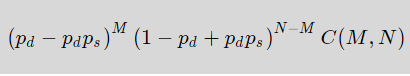

In [4]:
Image('formula7.png')

Запишите отрицательное логистическое правдоподобие (Negative Log Likelihood) для параметров $p_s$, $p_d$ из предыдущей задачи. Отбросьте все члены, которые не зависят от этих параметров.

Логарифм обозначайте как log, из-под логарифмов вынесите только степени.

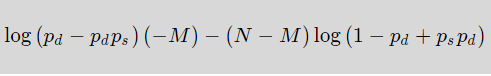

In [5]:
Image('formula6.png')

Пусть мы наблюдали некоторую выборку $m_1, \dots m_k$. Мы знаем, что все эти измерения были порождены распределением Пуассона с параметром $\lambda$:

$$p(m) = \frac{\lambda^m}{m!} \exp(-\lambda)$$

Запишите отрицательное логарифмическое правдоподобие для этого события относительно параметра $\lambda$.

Логарифм обозначайте как log, сумму mm по всем ii обозначайте как sum_i(m_i), $\lambda$ обозначайте как l (маленькая L), используйте k.

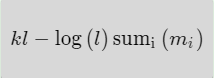

In [6]:
Image('formula8.png')

Найдите параметр $\lambda$ для предыдущей задачи, при котором достигается максимальное правдоподобие (соответственно, минимальное отрицательное логарифмическое правдоподобие).

Сумму mm по всем $i$ обозначайте как sum_i(m_i)

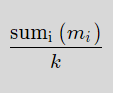

In [7]:
Image('formula10.png')

Вернемся к нормальному распределению. Пусть мы наблюдали некоторые значения $x_1, \dots, x_N$, и мы знаем, что эти значения были порождены нормальным распределением:

$$\frac{1}{\sqrt{2 \pi} \sigma} \exp\left( - \frac{(x - \mu)^2}{2 \sigma^2} \right)$$

Найдите отрицательное логарифмическое правдоподобие для параметров $\mu$ и $\sigma$. Отбросьте все члены, в которые не входят $\mu$ или $\sigma$.

Логарифм обозначайте как log, суммирование по всем индексам обозначайте как sum_i, $\sigma$ обозначайте как s, $\mu$ обозначайте как m.

В полученном ответе не раскрывайте знак суммы и не выносите общих множителей за знак суммы.

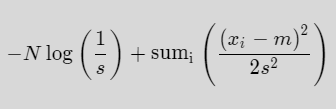

In [8]:
Image('formula12.png')

Для предыдущей задачи найдите значение $\mu$, при котором достигается максимальное правдоподобие.

Суммирование по всем $i$ обозначайте как sum_i

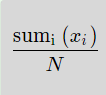

In [9]:
Image('formula13.png')

Для предыдущей задачи найдите значение $\sigma$, при котором достигается максимальное правдоподобие.

Квадратный корень обозначайте как sqrt, суммирование по всем i -- как sum_i, $\mu$ обозначайте как m.

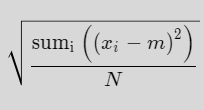

In [12]:
Image('formula14.png')

Допустим, что мы знаем $p(x|\lambda)$ -- вероятность наблюдать $x$ при условии параметра $\lambda$. Допустим, что мы также откуда-то знаем вероятности различных значений $\lambda$: $p(\lambda)$.

Найдите логарифм вероятности $p(\lambda | x)$. Отбросьте все члены, которые не зависят от $\lambda$.

Для этого вам может понадобится формула Байеса

$\lambda$ обозначайте как l.

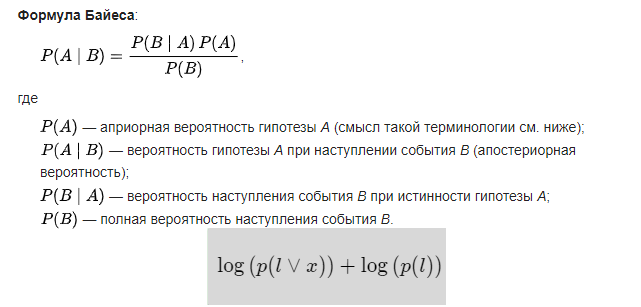

In [13]:
Image('formula18.png')

Пусть мы наблюдали $x_0, ... x_N$, а также мы знаем, что

$$p(x_i |\mu) = \frac{1}{\sqrt{2\pi}} \exp\left( - \frac{\left(x_i - \mu\right)^2}{2} \right)$$

$$p(\mu) = \frac{1}{\sqrt{2 \pi}} \exp\left( - \frac{\mu^2}{2}\right)$$

Найдите отрицательный логарифм апостериорной вероятности $\mu$: $\log p(\mu | x_i)$ и отбросьте все члены, которые не зависят от $\mu$.

Подумайте, как полученное выражение соотносится с регуляризацией.

$\mu$ обозначайте как $m$, суммирование по i обозначайте как sum_i. В полученных выражениях не выносите общие множители за знак суммирования.

# 1.20  Transfer learning на примере соревнования на Kaggle

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

import zipfile
with zipfile.ZipFile('../input/plates.zip', 'r') as zip_obj:
   # Extract all the contents of zip file in current directory
   zip_obj.extractall('/kaggle/working/')
    
print('After zip extraction:')
print(os.listdir("/kaggle/working/"))

In [ ]:
data_root = '/kaggle/working/plates/'
print(os.listdir(data_root))

In [ ]:
import shutil 
from tqdm import tqdm

train_dir = 'train'
val_dir = 'val'

class_names = ['cleaned', 'dirty']

for dir_name in [train_dir, val_dir]:
    for class_name in class_names:
        os.makedirs(os.path.join(dir_name, class_name), exist_ok=True)

for class_name in class_names:
    source_dir = os.path.join(data_root, 'train', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        if i % 6 != 0:
            dest_dir = os.path.join(train_dir, class_name) 
        else:
            dest_dir = os.path.join(val_dir, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

In [ ]:
!ls train

In [ ]:
import torch
import numpy as np
import torchvision
import matplotlib.pyplot as plt
import time
import copy
import PIL.ImageOps

from torchvision import transforms, models
train_transforms = transforms.Compose([
    transforms.CenterCrop(224),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(50),
    transforms.RandomHorizontalFlip(),
    transforms.Lambda(lambda x: PIL.ImageOps.invert(x)),
    transforms.Lambda(lambda x: x[np.random.permutation(3), :, :]),
    transforms.RandomAffine(degrees, translate=None, scale=None, shear=None, resample=False, fillcolor=0),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    transforms.ToTensor()
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset = torchvision.datasets.ImageFolder(train_dir, train_transforms)
val_dataset = torchvision.datasets.ImageFolder(val_dir, val_transforms)

batch_size = 8
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)

In [ ]:
len(train_dataloader), len(train_dataset)

In [ ]:
X_batch, y_batch = next(iter(train_dataloader))
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
plt.imshow(X_batch[0].permute(1, 2, 0).numpy() * std + mean);

In [ ]:
def show_input(input_tensor, title=''):
    image = input_tensor.permute(1, 2, 0).numpy()
    image = std * image + mean
    plt.imshow(image.clip(0, 1))
    plt.title(title)
    plt.show()
    plt.pause(0.001)

X_batch, y_batch = next(iter(train_dataloader))

for x_item, y_item in zip(X_batch, y_batch):
    show_input(x_item, title=class_names[y_item])

In [ ]:
train_accuracy_history = []
train_loss_history = []
val_accuracy_history = []
val_loss_history = []
def train_model(model, loss, optimizer, scheduler, num_epochs):
    for epoch in range(num_epochs):
        print('Epoch {}/{}:'.format(epoch, num_epochs - 1), flush=True)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                dataloader = train_dataloader
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                dataloader = val_dataloader
                model.eval()   # Set model to evaluate mode

            running_loss = 0.
            running_acc = 0.

            # Iterate over data.
            for inputs, labels in tqdm(dataloader):
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                # forward and backward
                with torch.set_grad_enabled(phase == 'train'):
                    preds = model(inputs)
                    loss_value = loss(preds, labels)
                    preds_class = preds.argmax(dim=1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss_value.backward()
                        optimizer.step()

                # statistics
                running_loss += loss_value.item()
                running_acc += (preds_class == labels.data).float().mean()

            epoch_loss = running_loss / len(dataloader)
            epoch_acc = running_acc / len(dataloader)
            if phase == 'train':
                train_accuracy_history.append(epoch_acc)
                train_loss_history.append(epoch_loss)
            else:
                val_accuracy_history.append(epoch_acc)
                val_loss_history.append(epoch_loss)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc), flush=True)

    return model

In [ ]:
model = models.resnet18(pretrained=True)

# Disable grad for all conv layers
for param in model.parameters():
    param.requires_grad = False

model.fc = torch.nn.Linear(model.fc.in_features, 2)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

loss = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1.0e-3)

# Decay LR by a factor of 0.1 every 7 epochs
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [ ]:
train_model(model, loss, optimizer, scheduler, num_epochs=100);

In [ ]:
plt.plot(train_accuracy_history);
plt.plot(train_loss_history);
plt.plot(val_accuracy_history);
plt.plot(val_loss_history);

In [ ]:
test_dir = 'test'
shutil.copytree(os.path.join(data_root, 'test'), os.path.join(test_dir, 'unknown'))

In [ ]:
class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path
    
test_dataset = ImageFolderWithPaths('/kaggle/working/test', val_transforms)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

In [ ]:
test_dataset

In [ ]:
model.eval()

test_predictions = []
test_img_paths = []
for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(device)
    labels = labels.to(device)
    with torch.set_grad_enabled(False):
        preds = model(inputs)
    test_predictions.append(
        torch.nn.functional.softmax(preds, dim=1)[:,1].data.cpu().numpy())
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions)

In [ ]:
inputs, labels, paths = next(iter(test_dataloader))

for img, pred in zip(inputs, test_predictions):
    show_input(img, title=pred)

In [ ]:
submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})

In [ ]:
submission_df['label'] = submission_df['label'].map(lambda pred: 'dirty' if pred > 0.5 else 'cleaned')
submission_df['id'] = submission_df['id'].str.replace('/kaggle/working/test/unknown/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df.set_index('id', inplace=True)
submission_df.head(n=6)

In [ ]:
submission_df.to_csv('submission.csv')

In [ ]:
!rm -rf train val test